**Imports & Drive Mount**

In [1]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd
# from monai.networks.nets import UNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [3]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [4]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES22_split"
print(data_dir)

D:/F25-156/ISLES22_split


In [5]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints"
log_dir = "D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

%load_ext tensorboard
%tensorboard --logdir "D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_logs"

Checkpoints will be saved to: D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints
TensorBoard logs will be saved to: D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_logs


Reusing TensorBoard on port 6008 (pid 14040), started 5 days, 6:15:59 ago. (Use '!kill 14040' to kill it.)

In [6]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

**MONAI Preprocessing Transforms**

In [7]:
# Target shape for all volumes
target_shape = (96,96,96)

sample_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(keys=["image"], spatial_size=target_shape),
    NormalizeIntensityd(keys=["image"], nonzero=True)
])

mask_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(
        keys=["image"],
        spatial_size=target_shape,
        mode="constant"
    )
])


**Dataset Class**

In [8]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


In [9]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files,
                 image_transform=None,
                 mask_transform=None):

        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):

        image_dict = {"image": self.dwi_files[idx]}
        mask_dict = {"image": self.mask_files[idx]}

        if self.image_transform:
            image_dict = self.image_transform(image_dict)

        if self.mask_transform:
            mask_dict = self.mask_transform(mask_dict)

        image = image_dict["image"].float()
        mask = mask_dict["image"].long()

        return {"image": image, "mask": mask}

**Load Files and Apply MONAI Transforms**

**Split into “Clients” (Federated Simulation)**


Client 0 - Raw Samples:
Sample 40 | Image shape: (128, 128, 25) | Mask shape: (128, 128, 25) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


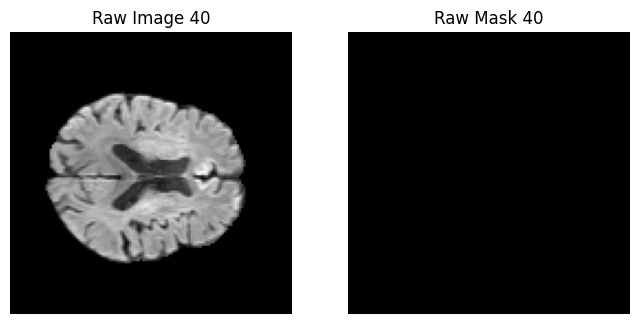

Sample 7 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


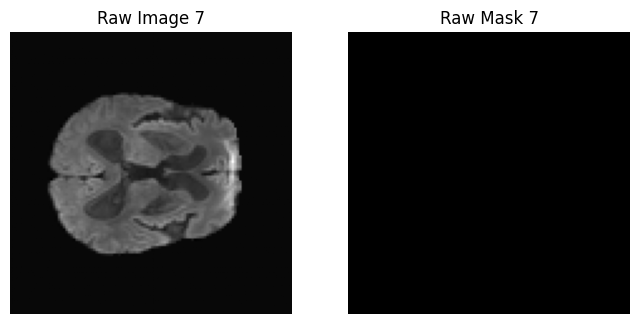

Client 0 - Preprocessed Samples:
Sample 40 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


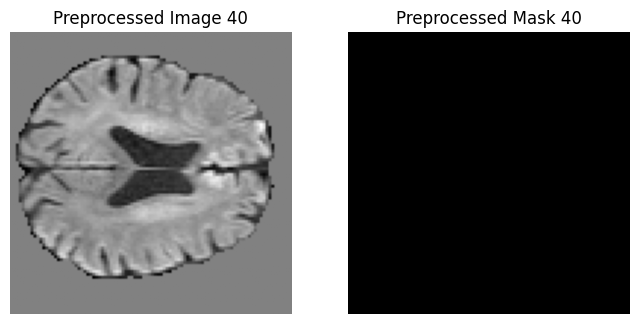

Sample 7 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


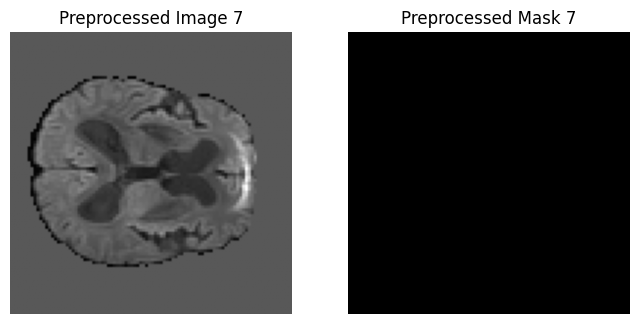

Client 0 samples: 50

Client 1 - Raw Samples:
Sample 1 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


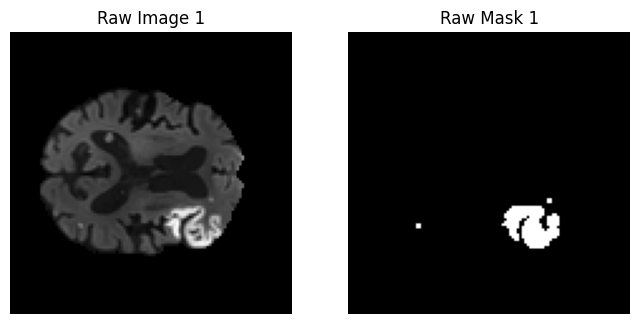

Sample 47 | Image shape: (192, 192, 30) | Mask shape: (192, 192, 30) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


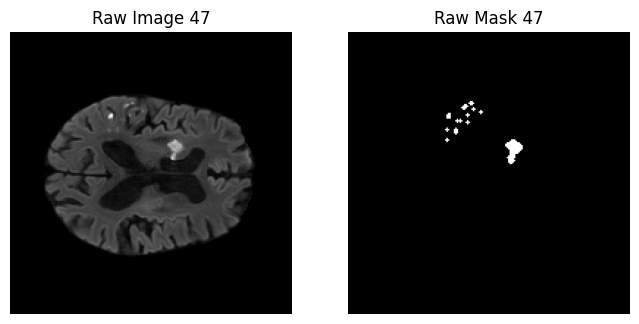

Client 1 - Preprocessed Samples:
Sample 1 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


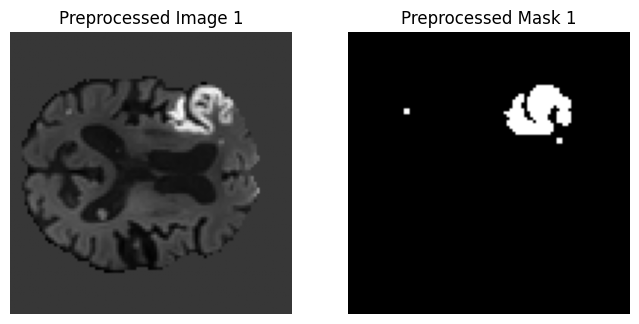

Sample 47 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


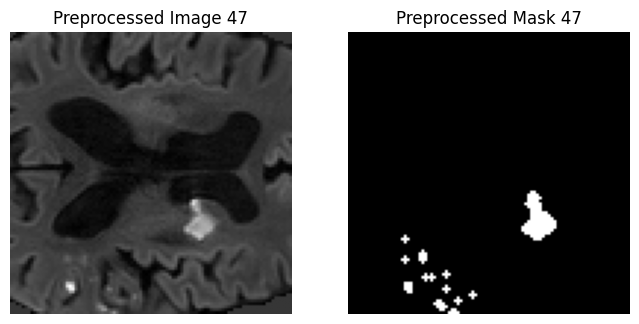

Client 1 samples: 50

Client 2 - Raw Samples:
Sample 17 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


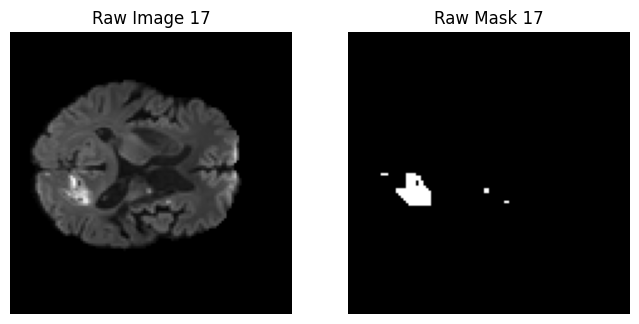

Sample 15 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


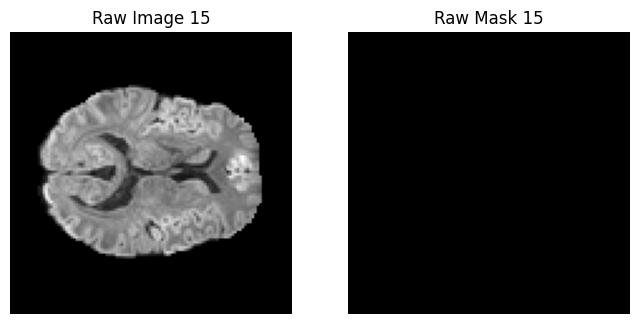

Client 2 - Preprocessed Samples:
Sample 17 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


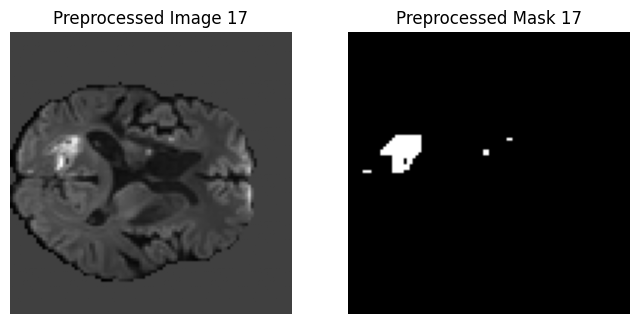

Sample 15 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


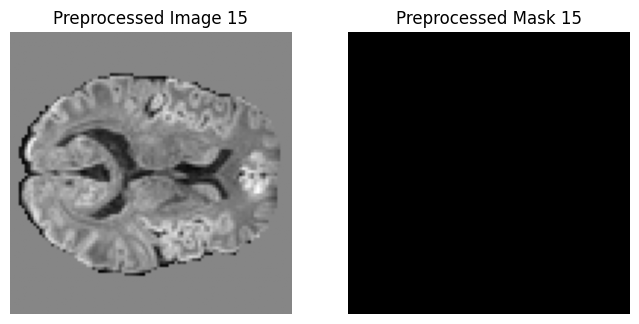

Client 2 samples: 50


In [10]:
num_clients = 3
client_datasets = []

for i in range(num_clients):
    client_path = os.path.join(data_dir, "train", f"client_{i}")
    dwi_files, mask_files = load_dwi_mask_pairs(client_path)

    # -----------------------------
    # Visualize 2 random raw samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)
    print(f"\nClient {i} - Raw Samples:")
    for idx in sample_indices:
        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()
        mask_tensor = torch.from_numpy(mask)
        
        print(f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | Mask Values: {torch.unique(mask_tensor)}")  #make sure mask only contains 0 and 1

        mid_slice = img.shape[2] // 2  # middle slice
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Mask {idx}")
        plt.axis("off")
        plt.show()

    # -----------------------------
    # Create preprocessed dataset
    # -----------------------------
    ds = ISLESDataset(
        dwi_files=dwi_files,
        mask_files=mask_files,
        image_transform=sample_transform,
        mask_transform=mask_transform
    )
    client_datasets.append(ds)

    # -----------------------------
    # Visualize 2 random preprocessed samples
    # -----------------------------
    print(f"Client {i} - Preprocessed Samples:")
    for idx in sample_indices:
        sample = ds[idx]
        img_proc = sample["image"][0].numpy()  # remove channel
        mask_proc = sample["mask"][0].numpy()
        print(f"Sample {idx} | Image shape: {img_proc.shape} | Mask shape: {mask_proc.shape}  | Mask Values: {torch.unique(sample['mask'])}")

        mid_slice = img_proc.shape[2] // 2
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Mask {idx}")
        plt.axis("off")
        plt.show()

    print(f"Client {i} samples: {len(ds)}")

**Validation Set**

In [11]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 50


Swin Factorizer

In [12]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [13]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda:0


In [14]:
!pip install git+https://github.com/pashtari/factorizer.git

  Cloning https://github.com/pashtari/factorizer.git to C:\Users\LAB\AppData\Local\Temp\pip-req-build-hyn93h29
  Resolved https://github.com/pashtari/factorizer.git to commit 9adcc5d3c5178d458f5720125ce450e7696f1e09
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'


  Running command git clone --filter=blob:none --quiet https://github.com/pashtari/factorizer.git 'C:\Users\LAB\AppData\Local\Temp\pip-req-build-hyn93h29'


In [15]:
import factorizer as ft

In [16]:
def create_model():
    model = ft.Factorizer(
        in_channels=1,
        out_channels=1,
        spatial_size=target_shape,
        encoder_depth=(1, 1, 1, 1),
        encoder_width=(32, 64, 128, 256),
        strides=(1, 2, 2, 2, 2),
        decoder_depth=(1, 1, 1, 1),
        norm=ft.LayerNorm,
        reshape=(ft.SWMatricize, {'head_dim': 8, 'patch_size': 2}),
        act=nn.ReLU,
        factorize=ft.NMF, 
        rank=1,
        num_iters=3,
        init="uniform",
        solver="hals",
        mlp_ratio=2,
        dropout=0.1
    ).to(device)
    print(model)
    return model

**Client Class**

In [17]:
class Client:
    def __init__(self, client_id, dataset, device):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)
                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0 
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics (or you can average them if you prefer)
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class (FedAvg)**

In [18]:
class Server:
    def __init__(self, val_loader, device):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):
        new_params = copy.deepcopy(client_params_list[0])

        for key in new_params.keys():
            for i in range(1, len(client_params_list)):
                new_params[key] += client_params_list[i][key]
            new_params[key] /= len(client_params_list)

        self.global_model.load_state_dict(new_params)

    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0 
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [19]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

Factorizer(
  (stem): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  (encoder): UNetEncoder(
    (blocks): ModuleList(
      (0): UNetEncoderBlock(
        (downsample): Identity()
        (block): FactorizerStage(
          (pos_embed): Identity()
          (blocks): ModuleList(
            (0): FactorizerBlock(
              (norm1): LayerNorm(
                (norm): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
              )
              (fact): FactMixer(
                (in_proj): Linear(
                  (flatten): Flatten(start_dim=2, end_dim=-1)
                  (linear): Conv1d(32, 32, kernel_size=(1,), stride=(1,), bias=False)
                )
                (reshape): SWMatricize(
                  (shifted_windows): ModuleList(
                    (0-1): 2 x Matricize(
                      (rearrange): Rearrange('b (h d) (g0 p0) (g1 p1) (g2 p2) -> (b h) (g0 g1 g2) d (p0 p1 p2)', d=8, p0=2, p1=2, p2=2)
                

**Federated Training loop**

In [20]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2  # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")
    
        # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------
    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8172 | Dice: 0.1599 | IoU: 0.0869 | HD95: 39.4483


Client 0 | Epoch 2/20 | Loss: 0.6738 | Dice: 0.1352 | IoU: 0.0725 | HD95: 32.2001


Client 0 | Epoch 3/20 | Loss: 0.5985 | Dice: 0.1671 | IoU: 0.0912 | HD95: 30.7373


Client 0 | Epoch 4/20 | Loss: 0.5816 | Dice: 0.1914 | IoU: 0.1058 | HD95: 31.5229


Client 0 | Epoch 5/20 | Loss: 0.5608 | Dice: 0.2228 | IoU: 0.1254 | HD95: 30.2334


Client 0 | Epoch 6/20 | Loss: 0.5410 | Dice: 0.2524 | IoU: 0.1444 | HD95: 32.1453


Client 0 | Epoch 7/20 | Loss: 0.5296 | Dice: 0.2686 | IoU: 0.1552 | HD95: 32.1468


Client 0 | Epoch 8/20 | Loss: 0.5165 | Dice: 0.2877 | IoU: 0.1680 | HD95: 33.2585


Client 0 | Epoch 9/20 | Loss: 0.5120 | Dice: 0.2941 | IoU: 0.1724 | HD95: 32.9540


Client 0 | Epoch 10/20 | Loss: 0.4952 | Dice: 0.3204 | IoU: 0.1908 | HD95: 32.1703


Client 0 | Epoch 11/20 | Loss: 0.4842 | Dice: 0.3331 | IoU: 0.1998 | HD95: 31.6797


Client 0 | Epoch 12/20 | Loss: 0.4932 | Dice: 0.3262 | IoU: 0.1949 | HD95: 31.3530


Client 0 | Epoch 13/20 | Loss: 0.4728 | Dice: 0.3522 | IoU: 0.2137 | HD95: 31.9698


Client 0 | Epoch 14/20 | Loss: 0.4486 | Dice: 0.3857 | IoU: 0.2389 | HD95: 31.2148


Client 0 | Epoch 15/20 | Loss: 0.4306 | Dice: 0.4079 | IoU: 0.2562 | HD95: 26.8215


Client 0 | Epoch 16/20 | Loss: 0.4130 | Dice: 0.4391 | IoU: 0.2813 | HD95: 24.2750


Client 0 | Epoch 17/20 | Loss: 0.4045 | Dice: 0.4488 | IoU: 0.2893 | HD95: 27.6802


Client 0 | Epoch 18/20 | Loss: 0.3531 | Dice: 0.5249 | IoU: 0.3559 | HD95: 21.8412


Client 0 | Epoch 19/20 | Loss: 0.3672 | Dice: 0.5017 | IoU: 0.3349 | HD95: 24.2050


Clients Training:  33%|███▎      | 1/3 [10:07<20:14, 607.32s/it]

Client 0 | Epoch 20/20 | Loss: 0.3420 | Dice: 0.5375 | IoU: 0.3675 | HD95: 19.7070
Client 0 | Loss=0.5018 | Dice=0.5375 | IoU=0.3675 | HD95=19.7070


Client 1 | Epoch 1/20 | Loss: 0.8163 | Dice: 0.1215 | IoU: 0.0647 | HD95: 38.2816


Client 1 | Epoch 2/20 | Loss: 0.6719 | Dice: 0.1313 | IoU: 0.0702 | HD95: 31.7590


Client 1 | Epoch 3/20 | Loss: 0.5877 | Dice: 0.1728 | IoU: 0.0946 | HD95: 32.3256


Client 1 | Epoch 4/20 | Loss: 0.5751 | Dice: 0.1911 | IoU: 0.1057 | HD95: 31.6475


Client 1 | Epoch 5/20 | Loss: 0.5409 | Dice: 0.2440 | IoU: 0.1390 | HD95: 32.1504


Client 1 | Epoch 6/20 | Loss: 0.5203 | Dice: 0.2714 | IoU: 0.1570 | HD95: 32.1710


Client 1 | Epoch 7/20 | Loss: 0.5108 | Dice: 0.2866 | IoU: 0.1673 | HD95: 32.1884


Client 1 | Epoch 8/20 | Loss: 0.5013 | Dice: 0.3033 | IoU: 0.1787 | HD95: 32.6830


Client 1 | Epoch 9/20 | Loss: 0.4957 | Dice: 0.3081 | IoU: 0.1821 | HD95: 32.6777


Client 1 | Epoch 10/20 | Loss: 0.4939 | Dice: 0.3122 | IoU: 0.1850 | HD95: 32.1407


Client 1 | Epoch 11/20 | Loss: 0.4747 | Dice: 0.3394 | IoU: 0.2044 | HD95: 31.2566


Client 1 | Epoch 12/20 | Loss: 0.4676 | Dice: 0.3465 | IoU: 0.2096 | HD95: 31.8175


Client 1 | Epoch 13/20 | Loss: 0.4738 | Dice: 0.3403 | IoU: 0.2051 | HD95: 31.8218


Client 1 | Epoch 14/20 | Loss: 0.4479 | Dice: 0.3754 | IoU: 0.2311 | HD95: 32.2221


Client 1 | Epoch 15/20 | Loss: 0.4294 | Dice: 0.4001 | IoU: 0.2501 | HD95: 29.4923


Client 1 | Epoch 16/20 | Loss: 0.4145 | Dice: 0.4226 | IoU: 0.2679 | HD95: 29.7401


Client 1 | Epoch 17/20 | Loss: 0.3872 | Dice: 0.4612 | IoU: 0.2997 | HD95: 26.5159


Client 1 | Epoch 18/20 | Loss: 0.3870 | Dice: 0.4587 | IoU: 0.2976 | HD95: 28.1496


Client 1 | Epoch 19/20 | Loss: 0.3678 | Dice: 0.4865 | IoU: 0.3214 | HD95: 25.1909


Clients Training:  67%|██████▋   | 2/3 [20:14<10:07, 607.11s/it]

Client 1 | Epoch 20/20 | Loss: 0.3349 | Dice: 0.5343 | IoU: 0.3645 | HD95: 20.2982
Client 1 | Loss=0.4949 | Dice=0.5343 | IoU=0.3645 | HD95=20.2982


Client 2 | Epoch 1/20 | Loss: 0.8133 | Dice: 0.1897 | IoU: 0.1048 | HD95: 38.8178


Client 2 | Epoch 2/20 | Loss: 0.6679 | Dice: 0.2558 | IoU: 0.1467 | HD95: 31.0995


Client 2 | Epoch 3/20 | Loss: 0.5518 | Dice: 0.2258 | IoU: 0.1273 | HD95: 27.7200


Client 2 | Epoch 4/20 | Loss: 0.5121 | Dice: 0.2835 | IoU: 0.1651 | HD95: 31.7426


Client 2 | Epoch 5/20 | Loss: 0.4861 | Dice: 0.3196 | IoU: 0.1902 | HD95: 31.6483


Client 2 | Epoch 6/20 | Loss: 0.4811 | Dice: 0.3256 | IoU: 0.1944 | HD95: 33.5959


Client 2 | Epoch 7/20 | Loss: 0.4724 | Dice: 0.3395 | IoU: 0.2044 | HD95: 33.2458


Client 2 | Epoch 8/20 | Loss: 0.4684 | Dice: 0.3454 | IoU: 0.2088 | HD95: 34.2505


Client 2 | Epoch 9/20 | Loss: 0.4609 | Dice: 0.3556 | IoU: 0.2163 | HD95: 33.9780


Client 2 | Epoch 10/20 | Loss: 0.4532 | Dice: 0.3678 | IoU: 0.2254 | HD95: 34.3948


Client 2 | Epoch 11/20 | Loss: 0.4512 | Dice: 0.3689 | IoU: 0.2262 | HD95: 34.3053


Client 2 | Epoch 12/20 | Loss: 0.4416 | Dice: 0.3836 | IoU: 0.2373 | HD95: 32.4037


Client 2 | Epoch 13/20 | Loss: 0.4296 | Dice: 0.3993 | IoU: 0.2495 | HD95: 33.4752


Client 2 | Epoch 14/20 | Loss: 0.4218 | Dice: 0.4124 | IoU: 0.2598 | HD95: 32.0229


Client 2 | Epoch 15/20 | Loss: 0.4133 | Dice: 0.4220 | IoU: 0.2674 | HD95: 30.8141


Client 2 | Epoch 16/20 | Loss: 0.4190 | Dice: 0.4174 | IoU: 0.2637 | HD95: 31.9451


Client 2 | Epoch 17/20 | Loss: 0.3952 | Dice: 0.4475 | IoU: 0.2883 | HD95: 29.7210


Client 2 | Epoch 18/20 | Loss: 0.3772 | Dice: 0.4721 | IoU: 0.3090 | HD95: 27.8058


Client 2 | Epoch 19/20 | Loss: 0.3699 | Dice: 0.4829 | IoU: 0.3183 | HD95: 25.6118


Client 2 Epochs: 100%|██████████| 20/20 [10:06<00:00, 30.32s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.3602 | Dice: 0.4956 | IoU: 0.3295 | HD95: 26.1368
Client 2 | Loss=0.4723 | Dice=0.4956 | IoU=0.3295 | HD95=26.1368


Best global model updated with Dice=0.4149
Global | Val Loss=0.4194 | Dice=0.4149 | IoU=0.2617 | HD95=33.1549
Checkpoint saved for round 1 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.3482 | Dice: 0.5273 | IoU: 0.3581 | HD95: 20.4951


Client 0 | Epoch 2/20 | Loss: 0.3327 | Dice: 0.5523 | IoU: 0.3815 | HD95: 22.0024


Client 0 | Epoch 3/20 | Loss: 0.2988 | Dice: 0.5996 | IoU: 0.4281 | HD95: 16.1486


Client 0 | Epoch 4/20 | Loss: 0.3033 | Dice: 0.5952 | IoU: 0.4237 | HD95: 15.6746


Client 0 | Epoch 5/20 | Loss: 0.3480 | Dice: 0.5272 | IoU: 0.3580 | HD95: 24.3628


Client 0 | Epoch 6/20 | Loss: 0.3174 | Dice: 0.5735 | IoU: 0.4020 | HD95: 20.2403


Client 0 | Epoch 7/20 | Loss: 0.2998 | Dice: 0.5999 | IoU: 0.4284 | HD95: 16.2732


Client 0 | Epoch 8/20 | Loss: 0.2683 | Dice: 0.6458 | IoU: 0.4769 | HD95: 12.9668


Client 0 | Epoch 9/20 | Loss: 0.2846 | Dice: 0.6199 | IoU: 0.4491 | HD95: 14.0309


Client 0 | Epoch 10/20 | Loss: 0.2666 | Dice: 0.6456 | IoU: 0.4766 | HD95: 13.3556


Client 0 | Epoch 11/20 | Loss: 0.2538 | Dice: 0.6635 | IoU: 0.4965 | HD95: 12.0661


Client 0 | Epoch 12/20 | Loss: 0.2395 | Dice: 0.6851 | IoU: 0.5210 | HD95: 10.7477


Client 0 | Epoch 13/20 | Loss: 0.2407 | Dice: 0.6845 | IoU: 0.5203 | HD95: 11.6569


Client 0 | Epoch 14/20 | Loss: 0.2415 | Dice: 0.6827 | IoU: 0.5183 | HD95: 9.8067


Client 0 | Epoch 15/20 | Loss: 0.2354 | Dice: 0.6930 | IoU: 0.5302 | HD95: 11.8951


Client 0 | Epoch 16/20 | Loss: 0.2371 | Dice: 0.6876 | IoU: 0.5239 | HD95: 11.9306


Client 0 | Epoch 17/20 | Loss: 0.2200 | Dice: 0.7138 | IoU: 0.5550 | HD95: 9.9966


Client 0 | Epoch 18/20 | Loss: 0.2222 | Dice: 0.7091 | IoU: 0.5493 | HD95: 10.8221


Client 0 | Epoch 19/20 | Loss: 0.2151 | Dice: 0.7189 | IoU: 0.5611 | HD95: 8.8607


Clients Training:  33%|███▎      | 1/3 [09:54<19:48, 594.07s/it]

Client 0 | Epoch 20/20 | Loss: 0.2054 | Dice: 0.7335 | IoU: 0.5791 | HD95: 8.3428
Client 0 | Loss=0.2689 | Dice=0.7335 | IoU=0.5791 | HD95=8.3428


Client 1 | Epoch 1/20 | Loss: 0.3581 | Dice: 0.4996 | IoU: 0.3330 | HD95: 25.2176


Client 1 | Epoch 2/20 | Loss: 0.3380 | Dice: 0.5291 | IoU: 0.3597 | HD95: 22.2865


Client 1 | Epoch 3/20 | Loss: 0.3310 | Dice: 0.5405 | IoU: 0.3703 | HD95: 19.1994


Client 1 | Epoch 4/20 | Loss: 0.3348 | Dice: 0.5328 | IoU: 0.3631 | HD95: 18.7221


Client 1 | Epoch 5/20 | Loss: 0.2877 | Dice: 0.5999 | IoU: 0.4285 | HD95: 17.5895


Client 1 | Epoch 6/20 | Loss: 0.2865 | Dice: 0.6009 | IoU: 0.4295 | HD95: 15.8143


Client 1 | Epoch 7/20 | Loss: 0.3004 | Dice: 0.5816 | IoU: 0.4101 | HD95: 16.7588


Client 1 | Epoch 8/20 | Loss: 0.2916 | Dice: 0.5941 | IoU: 0.4226 | HD95: 16.0122


Client 1 | Epoch 9/20 | Loss: 0.3158 | Dice: 0.5608 | IoU: 0.3896 | HD95: 16.0338


Client 1 | Epoch 10/20 | Loss: 0.2659 | Dice: 0.6301 | IoU: 0.4600 | HD95: 16.6948


Client 1 | Epoch 11/20 | Loss: 0.2523 | Dice: 0.6491 | IoU: 0.4805 | HD95: 12.6917


Client 1 | Epoch 12/20 | Loss: 0.2445 | Dice: 0.6604 | IoU: 0.4929 | HD95: 13.8276


Client 1 | Epoch 13/20 | Loss: 0.2416 | Dice: 0.6638 | IoU: 0.4967 | HD95: 14.8388


Client 1 | Epoch 14/20 | Loss: 0.2515 | Dice: 0.6501 | IoU: 0.4816 | HD95: 13.8812


Client 1 | Epoch 15/20 | Loss: 0.2265 | Dice: 0.6861 | IoU: 0.5222 | HD95: 13.4142


Client 1 | Epoch 16/20 | Loss: 0.2215 | Dice: 0.6922 | IoU: 0.5292 | HD95: 12.6505


Client 1 | Epoch 17/20 | Loss: 0.2161 | Dice: 0.6994 | IoU: 0.5378 | HD95: 9.2880


Client 1 | Epoch 18/20 | Loss: 0.2239 | Dice: 0.6881 | IoU: 0.5246 | HD95: 11.8492


Client 1 | Epoch 19/20 | Loss: 0.2070 | Dice: 0.7131 | IoU: 0.5541 | HD95: 11.8658


Clients Training:  67%|██████▋   | 2/3 [19:52<09:56, 596.37s/it]

Client 1 | Epoch 20/20 | Loss: 0.1991 | Dice: 0.7229 | IoU: 0.5661 | HD95: 11.0182
Client 1 | Loss=0.2697 | Dice=0.7229 | IoU=0.5661 | HD95=11.0182


Client 2 | Epoch 1/20 | Loss: 0.3988 | Dice: 0.4428 | IoU: 0.2843 | HD95: 26.5859


Client 2 | Epoch 2/20 | Loss: 0.3690 | Dice: 0.4836 | IoU: 0.3189 | HD95: 25.0161


Client 2 | Epoch 3/20 | Loss: 0.3555 | Dice: 0.5038 | IoU: 0.3367 | HD95: 22.1745


Client 2 | Epoch 4/20 | Loss: 0.3268 | Dice: 0.5433 | IoU: 0.3730 | HD95: 23.7868


Client 2 | Epoch 5/20 | Loss: 0.2953 | Dice: 0.5886 | IoU: 0.4170 | HD95: 18.5789


Client 2 | Epoch 6/20 | Loss: 0.2945 | Dice: 0.5891 | IoU: 0.4175 | HD95: 17.0181


Client 2 | Epoch 7/20 | Loss: 0.2754 | Dice: 0.6171 | IoU: 0.4463 | HD95: 16.4757


Client 2 | Epoch 8/20 | Loss: 0.2830 | Dice: 0.6053 | IoU: 0.4340 | HD95: 17.1293


Client 2 | Epoch 9/20 | Loss: 0.2606 | Dice: 0.6380 | IoU: 0.4684 | HD95: 14.3307


Client 2 | Epoch 10/20 | Loss: 0.2684 | Dice: 0.6281 | IoU: 0.4579 | HD95: 14.9609


Client 2 | Epoch 11/20 | Loss: 0.2501 | Dice: 0.6522 | IoU: 0.4840 | HD95: 14.7553


Client 2 | Epoch 12/20 | Loss: 0.2446 | Dice: 0.6615 | IoU: 0.4943 | HD95: 13.6389


Client 2 | Epoch 13/20 | Loss: 0.2632 | Dice: 0.6340 | IoU: 0.4642 | HD95: 12.4638


Client 2 | Epoch 14/20 | Loss: 0.2300 | Dice: 0.6812 | IoU: 0.5165 | HD95: 11.2986


Client 2 | Epoch 15/20 | Loss: 0.2565 | Dice: 0.6448 | IoU: 0.4757 | HD95: 15.9146


Client 2 | Epoch 16/20 | Loss: 0.2455 | Dice: 0.6584 | IoU: 0.4908 | HD95: 16.0959


Client 2 | Epoch 17/20 | Loss: 0.2459 | Dice: 0.6591 | IoU: 0.4915 | HD95: 13.7005


Client 2 | Epoch 18/20 | Loss: 0.2183 | Dice: 0.6982 | IoU: 0.5363 | HD95: 11.0826


Client 2 | Epoch 19/20 | Loss: 0.2118 | Dice: 0.7067 | IoU: 0.5464 | HD95: 9.1777


Client 2 Epochs: 100%|██████████| 20/20 [09:57<00:00, 29.88s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1992 | Dice: 0.7232 | IoU: 0.5664 | HD95: 9.6436
Client 2 | Loss=0.2746 | Dice=0.7232 | IoU=0.5664 | HD95=9.6436


Best global model updated with Dice=0.6164
Global | Val Loss=0.2805 | Dice=0.6164 | IoU=0.4455 | HD95=18.4238
Checkpoint saved for round 2 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2673 | Dice: 0.6438 | IoU: 0.4747 | HD95: 14.8750


Client 0 | Epoch 2/20 | Loss: 0.2642 | Dice: 0.6504 | IoU: 0.4819 | HD95: 14.4860


Client 0 | Epoch 3/20 | Loss: 0.2563 | Dice: 0.6592 | IoU: 0.4916 | HD95: 13.3027


Client 0 | Epoch 4/20 | Loss: 0.2364 | Dice: 0.6884 | IoU: 0.5249 | HD95: 14.0542


Client 0 | Epoch 5/20 | Loss: 0.2354 | Dice: 0.6911 | IoU: 0.5280 | HD95: 13.2995


Client 0 | Epoch 6/20 | Loss: 0.2139 | Dice: 0.7205 | IoU: 0.5631 | HD95: 11.0036


Client 0 | Epoch 7/20 | Loss: 0.2019 | Dice: 0.7400 | IoU: 0.5873 | HD95: 7.7387


Client 0 | Epoch 8/20 | Loss: 0.2009 | Dice: 0.7411 | IoU: 0.5887 | HD95: 8.6106


Client 0 | Epoch 9/20 | Loss: 0.2003 | Dice: 0.7425 | IoU: 0.5904 | HD95: 7.2230


Client 0 | Epoch 10/20 | Loss: 0.1925 | Dice: 0.7527 | IoU: 0.6034 | HD95: 7.8984


Client 0 | Epoch 11/20 | Loss: 0.1861 | Dice: 0.7623 | IoU: 0.6158 | HD95: 6.5328


Client 0 | Epoch 12/20 | Loss: 0.1861 | Dice: 0.7635 | IoU: 0.6174 | HD95: 7.4239


Client 0 | Epoch 13/20 | Loss: 0.1831 | Dice: 0.7643 | IoU: 0.6185 | HD95: 7.1617


Client 0 | Epoch 14/20 | Loss: 0.1770 | Dice: 0.7742 | IoU: 0.6316 | HD95: 5.2520


Client 0 | Epoch 15/20 | Loss: 0.1802 | Dice: 0.7677 | IoU: 0.6230 | HD95: 7.0078


Client 0 | Epoch 16/20 | Loss: 0.1933 | Dice: 0.7495 | IoU: 0.5994 | HD95: 8.2264


Client 0 | Epoch 17/20 | Loss: 0.2027 | Dice: 0.7376 | IoU: 0.5843 | HD95: 7.5654


Client 0 | Epoch 18/20 | Loss: 0.1900 | Dice: 0.7551 | IoU: 0.6066 | HD95: 8.9806


Client 0 | Epoch 19/20 | Loss: 0.1767 | Dice: 0.7754 | IoU: 0.6331 | HD95: 6.8981


Clients Training:  33%|███▎      | 1/3 [09:53<19:47, 593.62s/it]

Client 0 | Epoch 20/20 | Loss: 0.1768 | Dice: 0.7734 | IoU: 0.6305 | HD95: 6.0630
Client 0 | Loss=0.2061 | Dice=0.7734 | IoU=0.6305 | HD95=6.0630


Client 1 | Epoch 1/20 | Loss: 0.2574 | Dice: 0.6400 | IoU: 0.4706 | HD95: 15.6452


Client 1 | Epoch 2/20 | Loss: 0.2713 | Dice: 0.6208 | IoU: 0.4501 | HD95: 13.3355


Client 1 | Epoch 3/20 | Loss: 0.2571 | Dice: 0.6430 | IoU: 0.4738 | HD95: 15.5296


Client 1 | Epoch 4/20 | Loss: 0.2521 | Dice: 0.6491 | IoU: 0.4805 | HD95: 13.1177


Client 1 | Epoch 5/20 | Loss: 0.2137 | Dice: 0.7030 | IoU: 0.5421 | HD95: 11.7459


Client 1 | Epoch 6/20 | Loss: 0.2151 | Dice: 0.7022 | IoU: 0.5411 | HD95: 10.8625


Client 1 | Epoch 7/20 | Loss: 0.1985 | Dice: 0.7253 | IoU: 0.5690 | HD95: 10.2794


Client 1 | Epoch 8/20 | Loss: 0.1897 | Dice: 0.7384 | IoU: 0.5853 | HD95: 10.5187


Client 1 | Epoch 9/20 | Loss: 0.2279 | Dice: 0.6837 | IoU: 0.5194 | HD95: 12.3854


Client 1 | Epoch 10/20 | Loss: 0.1994 | Dice: 0.7244 | IoU: 0.5678 | HD95: 9.8243


Client 1 | Epoch 11/20 | Loss: 0.2116 | Dice: 0.7081 | IoU: 0.5481 | HD95: 11.1427


Client 1 | Epoch 12/20 | Loss: 0.2280 | Dice: 0.6855 | IoU: 0.5215 | HD95: 10.9317


Client 1 | Epoch 13/20 | Loss: 0.2064 | Dice: 0.7152 | IoU: 0.5566 | HD95: 8.7666


Client 1 | Epoch 14/20 | Loss: 0.1944 | Dice: 0.7299 | IoU: 0.5747 | HD95: 9.9374


Client 1 | Epoch 15/20 | Loss: 0.1829 | Dice: 0.7465 | IoU: 0.5955 | HD95: 8.9308


Client 1 | Epoch 16/20 | Loss: 0.1784 | Dice: 0.7539 | IoU: 0.6050 | HD95: 9.5681


Client 1 | Epoch 17/20 | Loss: 0.1723 | Dice: 0.7601 | IoU: 0.6131 | HD95: 8.3068


Client 1 | Epoch 18/20 | Loss: 0.1684 | Dice: 0.7668 | IoU: 0.6219 | HD95: 8.2578


Client 1 | Epoch 19/20 | Loss: 0.1673 | Dice: 0.7689 | IoU: 0.6246 | HD95: 7.9634


Clients Training:  67%|██████▋   | 2/3 [19:48<09:54, 594.23s/it]

Client 1 | Epoch 20/20 | Loss: 0.1623 | Dice: 0.7755 | IoU: 0.6333 | HD95: 7.9086
Client 1 | Loss=0.2077 | Dice=0.7755 | IoU=0.6333 | HD95=7.9086


Client 2 | Epoch 1/20 | Loss: 0.2386 | Dice: 0.6669 | IoU: 0.5002 | HD95: 13.1931


Client 2 | Epoch 2/20 | Loss: 0.2314 | Dice: 0.6777 | IoU: 0.5126 | HD95: 13.5288


Client 2 | Epoch 3/20 | Loss: 0.2353 | Dice: 0.6749 | IoU: 0.5093 | HD95: 10.9424


Client 2 | Epoch 4/20 | Loss: 0.2094 | Dice: 0.7093 | IoU: 0.5495 | HD95: 10.5520


Client 2 | Epoch 5/20 | Loss: 0.2024 | Dice: 0.7195 | IoU: 0.5619 | HD95: 10.5871


Client 2 | Epoch 6/20 | Loss: 0.1969 | Dice: 0.7268 | IoU: 0.5709 | HD95: 11.6818


Client 2 | Epoch 7/20 | Loss: 0.1871 | Dice: 0.7406 | IoU: 0.5881 | HD95: 9.6350


Client 2 | Epoch 8/20 | Loss: 0.1939 | Dice: 0.7319 | IoU: 0.5772 | HD95: 8.3763


Client 2 | Epoch 9/20 | Loss: 0.1967 | Dice: 0.7264 | IoU: 0.5704 | HD95: 10.9504


Client 2 | Epoch 10/20 | Loss: 0.1800 | Dice: 0.7514 | IoU: 0.6018 | HD95: 9.0341


Client 2 | Epoch 11/20 | Loss: 0.1725 | Dice: 0.7619 | IoU: 0.6154 | HD95: 8.3305


Client 2 | Epoch 12/20 | Loss: 0.1781 | Dice: 0.7531 | IoU: 0.6040 | HD95: 9.4935


Client 2 | Epoch 13/20 | Loss: 0.1770 | Dice: 0.7542 | IoU: 0.6054 | HD95: 8.4084


Client 2 | Epoch 14/20 | Loss: 0.1745 | Dice: 0.7571 | IoU: 0.6092 | HD95: 9.3338


Client 2 | Epoch 15/20 | Loss: 0.1706 | Dice: 0.7633 | IoU: 0.6172 | HD95: 8.6331


Client 2 | Epoch 16/20 | Loss: 0.1639 | Dice: 0.7720 | IoU: 0.6287 | HD95: 8.3026


Client 2 | Epoch 17/20 | Loss: 0.1565 | Dice: 0.7830 | IoU: 0.6434 | HD95: 7.6316


Client 2 | Epoch 18/20 | Loss: 0.1752 | Dice: 0.7577 | IoU: 0.6100 | HD95: 8.2333


Client 2 | Epoch 19/20 | Loss: 0.1846 | Dice: 0.7433 | IoU: 0.5915 | HD95: 8.1784


Client 2 Epochs: 100%|██████████| 20/20 [09:52<00:00, 29.64s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1664 | Dice: 0.7700 | IoU: 0.6260 | HD95: 7.1581
Client 2 | Loss=0.1895 | Dice=0.7700 | IoU=0.6260 | HD95=7.1581


Best global model updated with Dice=0.6590
Global | Val Loss=0.2503 | Dice=0.6590 | IoU=0.4914 | HD95=16.0236
Checkpoint saved for round 3 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round3.pth

--- Communication Round 4 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2111 | Dice: 0.7233 | IoU: 0.5665 | HD95: 11.2515


Client 0 | Epoch 2/20 | Loss: 0.2038 | Dice: 0.7343 | IoU: 0.5802 | HD95: 11.8208


Client 0 | Epoch 3/20 | Loss: 0.1966 | Dice: 0.7458 | IoU: 0.5946 | HD95: 8.0857


Client 0 | Epoch 4/20 | Loss: 0.1776 | Dice: 0.7711 | IoU: 0.6275 | HD95: 7.8142


Client 0 | Epoch 5/20 | Loss: 0.1705 | Dice: 0.7839 | IoU: 0.6446 | HD95: 5.0074


Client 0 | Epoch 6/20 | Loss: 0.1645 | Dice: 0.7919 | IoU: 0.6555 | HD95: 5.6014


Client 0 | Epoch 7/20 | Loss: 0.1629 | Dice: 0.7926 | IoU: 0.6564 | HD95: 5.6155


Client 0 | Epoch 8/20 | Loss: 0.1703 | Dice: 0.7834 | IoU: 0.6439 | HD95: 7.6010


Client 0 | Epoch 9/20 | Loss: 0.1650 | Dice: 0.7909 | IoU: 0.6541 | HD95: 5.4978


Client 0 | Epoch 10/20 | Loss: 0.1580 | Dice: 0.8000 | IoU: 0.6667 | HD95: 5.2175


Client 0 | Epoch 11/20 | Loss: 0.1610 | Dice: 0.7974 | IoU: 0.6631 | HD95: 5.8040


Client 0 | Epoch 12/20 | Loss: 0.1546 | Dice: 0.8044 | IoU: 0.6729 | HD95: 5.5870


Client 0 | Epoch 13/20 | Loss: 0.1599 | Dice: 0.7962 | IoU: 0.6614 | HD95: 5.7344


Client 0 | Epoch 14/20 | Loss: 0.1716 | Dice: 0.7812 | IoU: 0.6410 | HD95: 8.4085


Client 0 | Epoch 15/20 | Loss: 0.1578 | Dice: 0.8001 | IoU: 0.6669 | HD95: 5.5172


Client 0 | Epoch 16/20 | Loss: 0.2009 | Dice: 0.7361 | IoU: 0.5824 | HD95: 11.3449


Client 0 | Epoch 17/20 | Loss: 0.1610 | Dice: 0.7956 | IoU: 0.6606 | HD95: 5.5533


Client 0 | Epoch 18/20 | Loss: 0.2080 | Dice: 0.7281 | IoU: 0.5724 | HD95: 11.3516


Client 0 | Epoch 19/20 | Loss: 0.1691 | Dice: 0.7883 | IoU: 0.6506 | HD95: 6.5873


Clients Training:  33%|███▎      | 1/3 [09:50<19:41, 590.59s/it]

Client 0 | Epoch 20/20 | Loss: 0.1553 | Dice: 0.8037 | IoU: 0.6718 | HD95: 5.7506
Client 0 | Loss=0.1740 | Dice=0.8037 | IoU=0.6718 | HD95=5.7506


Client 1 | Epoch 1/20 | Loss: 0.2770 | Dice: 0.6157 | IoU: 0.4448 | HD95: 16.4534


Client 1 | Epoch 2/20 | Loss: 0.2487 | Dice: 0.6538 | IoU: 0.4857 | HD95: 16.1687


Client 1 | Epoch 3/20 | Loss: 0.2080 | Dice: 0.7112 | IoU: 0.5518 | HD95: 11.4471


Client 1 | Epoch 4/20 | Loss: 0.2159 | Dice: 0.6998 | IoU: 0.5382 | HD95: 10.8012


Client 1 | Epoch 5/20 | Loss: 0.1954 | Dice: 0.7302 | IoU: 0.5750 | HD95: 10.6453


Client 1 | Epoch 6/20 | Loss: 0.1786 | Dice: 0.7540 | IoU: 0.6052 | HD95: 8.4421


Client 1 | Epoch 7/20 | Loss: 0.1711 | Dice: 0.7643 | IoU: 0.6186 | HD95: 7.9986


Client 1 | Epoch 8/20 | Loss: 0.1681 | Dice: 0.7685 | IoU: 0.6241 | HD95: 9.1094


Client 1 | Epoch 9/20 | Loss: 0.1628 | Dice: 0.7748 | IoU: 0.6324 | HD95: 7.2580


Client 1 | Epoch 10/20 | Loss: 0.1547 | Dice: 0.7866 | IoU: 0.6483 | HD95: 7.8092


Client 1 | Epoch 11/20 | Loss: 0.1678 | Dice: 0.7683 | IoU: 0.6238 | HD95: 7.7591


Client 1 | Epoch 12/20 | Loss: 0.1523 | Dice: 0.7907 | IoU: 0.6539 | HD95: 7.7548


Client 1 | Epoch 13/20 | Loss: 0.1440 | Dice: 0.8024 | IoU: 0.6700 | HD95: 6.5202


Client 1 | Epoch 14/20 | Loss: 0.1555 | Dice: 0.7843 | IoU: 0.6452 | HD95: 7.8656


Client 1 | Epoch 15/20 | Loss: 0.1509 | Dice: 0.7922 | IoU: 0.6558 | HD95: 8.2438


Client 1 | Epoch 16/20 | Loss: 0.1454 | Dice: 0.7992 | IoU: 0.6655 | HD95: 7.2057


Client 1 | Epoch 17/20 | Loss: 0.1365 | Dice: 0.8124 | IoU: 0.6841 | HD95: 6.2980


Client 1 | Epoch 18/20 | Loss: 0.1391 | Dice: 0.8100 | IoU: 0.6807 | HD95: 5.8587


Client 1 | Epoch 19/20 | Loss: 0.1415 | Dice: 0.8063 | IoU: 0.6755 | HD95: 6.5215


Clients Training:  67%|██████▋   | 2/3 [19:44<09:52, 592.70s/it]

Client 1 | Epoch 20/20 | Loss: 0.1333 | Dice: 0.8171 | IoU: 0.6907 | HD95: 6.5130
Client 1 | Loss=0.1723 | Dice=0.8171 | IoU=0.6907 | HD95=6.5130


Client 2 | Epoch 1/20 | Loss: 0.1949 | Dice: 0.7288 | IoU: 0.5733 | HD95: 11.7212


Client 2 | Epoch 2/20 | Loss: 0.1893 | Dice: 0.7371 | IoU: 0.5836 | HD95: 9.2131


Client 2 | Epoch 3/20 | Loss: 0.1868 | Dice: 0.7395 | IoU: 0.5866 | HD95: 9.3616


Client 2 | Epoch 4/20 | Loss: 0.2299 | Dice: 0.6809 | IoU: 0.5162 | HD95: 15.4290


Client 2 | Epoch 5/20 | Loss: 0.1783 | Dice: 0.7523 | IoU: 0.6029 | HD95: 8.4259


Client 2 | Epoch 6/20 | Loss: 0.1913 | Dice: 0.7341 | IoU: 0.5800 | HD95: 12.7368


Client 2 | Epoch 7/20 | Loss: 0.1857 | Dice: 0.7427 | IoU: 0.5907 | HD95: 11.0406


Client 2 | Epoch 8/20 | Loss: 0.1698 | Dice: 0.7644 | IoU: 0.6187 | HD95: 8.3271


Client 2 | Epoch 9/20 | Loss: 0.1668 | Dice: 0.7695 | IoU: 0.6254 | HD95: 8.8264


Client 2 | Epoch 10/20 | Loss: 0.1698 | Dice: 0.7644 | IoU: 0.6186 | HD95: 10.5474


Client 2 | Epoch 11/20 | Loss: 0.1532 | Dice: 0.7870 | IoU: 0.6489 | HD95: 7.0537


Client 2 | Epoch 12/20 | Loss: 0.1468 | Dice: 0.7969 | IoU: 0.6623 | HD95: 8.2251


Client 2 | Epoch 13/20 | Loss: 0.1431 | Dice: 0.8011 | IoU: 0.6682 | HD95: 7.3835


Client 2 | Epoch 14/20 | Loss: 0.1405 | Dice: 0.8051 | IoU: 0.6738 | HD95: 6.8567


Client 2 | Epoch 15/20 | Loss: 0.1385 | Dice: 0.8071 | IoU: 0.6765 | HD95: 6.5924


Client 2 | Epoch 16/20 | Loss: 0.1368 | Dice: 0.8092 | IoU: 0.6795 | HD95: 6.7825


Client 2 | Epoch 17/20 | Loss: 0.1353 | Dice: 0.8126 | IoU: 0.6844 | HD95: 6.6809


Client 2 | Epoch 18/20 | Loss: 0.1324 | Dice: 0.8158 | IoU: 0.6889 | HD95: 6.6354


Client 2 | Epoch 19/20 | Loss: 0.1323 | Dice: 0.8164 | IoU: 0.6897 | HD95: 6.6027


Client 2 Epochs: 100%|██████████| 20/20 [09:50<00:00, 29.53s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1391 | Dice: 0.8073 | IoU: 0.6768 | HD95: 7.8876
Client 2 | Loss=0.1630 | Dice=0.8073 | IoU=0.6768 | HD95=7.8876


Best global model updated with Dice=0.6703
Global | Val Loss=0.2416 | Dice=0.6703 | IoU=0.5041 | HD95=14.3092
Checkpoint saved for round 4 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1727 | Dice: 0.7789 | IoU: 0.6379 | HD95: 6.8644


Client 0 | Epoch 2/20 | Loss: 0.1660 | Dice: 0.7884 | IoU: 0.6507 | HD95: 7.6045


Client 0 | Epoch 3/20 | Loss: 0.1690 | Dice: 0.7858 | IoU: 0.6472 | HD95: 6.6375


Client 0 | Epoch 4/20 | Loss: 0.1547 | Dice: 0.8051 | IoU: 0.6738 | HD95: 5.4056


Client 0 | Epoch 5/20 | Loss: 0.1515 | Dice: 0.8092 | IoU: 0.6795 | HD95: 4.5747


Client 0 | Epoch 6/20 | Loss: 0.1490 | Dice: 0.8132 | IoU: 0.6852 | HD95: 4.9205


Client 0 | Epoch 7/20 | Loss: 0.1475 | Dice: 0.8149 | IoU: 0.6877 | HD95: 5.3512


Client 0 | Epoch 8/20 | Loss: 0.1483 | Dice: 0.8142 | IoU: 0.6867 | HD95: 5.5729


Client 0 | Epoch 9/20 | Loss: 0.1479 | Dice: 0.8140 | IoU: 0.6864 | HD95: 5.2461


Client 0 | Epoch 10/20 | Loss: 0.1410 | Dice: 0.8240 | IoU: 0.7006 | HD95: 5.5181


Client 0 | Epoch 11/20 | Loss: 0.1476 | Dice: 0.8153 | IoU: 0.6882 | HD95: 5.2588


Client 0 | Epoch 12/20 | Loss: 0.1394 | Dice: 0.8249 | IoU: 0.7020 | HD95: 4.8203


Client 0 | Epoch 13/20 | Loss: 0.1366 | Dice: 0.8290 | IoU: 0.7080 | HD95: 4.8042


Client 0 | Epoch 14/20 | Loss: 0.1359 | Dice: 0.8300 | IoU: 0.7094 | HD95: 4.7479


Client 0 | Epoch 15/20 | Loss: 0.1346 | Dice: 0.8325 | IoU: 0.7131 | HD95: 4.9084


Client 0 | Epoch 16/20 | Loss: 0.1318 | Dice: 0.8361 | IoU: 0.7184 | HD95: 5.1102


Client 0 | Epoch 17/20 | Loss: 0.1287 | Dice: 0.8409 | IoU: 0.7255 | HD95: 4.2495


Client 0 | Epoch 18/20 | Loss: 0.1275 | Dice: 0.8428 | IoU: 0.7284 | HD95: 4.5529


Client 0 | Epoch 19/20 | Loss: 0.1269 | Dice: 0.8430 | IoU: 0.7285 | HD95: 4.5197


Clients Training:  33%|███▎      | 1/3 [09:50<19:41, 590.87s/it]

Client 0 | Epoch 20/20 | Loss: 0.1269 | Dice: 0.8426 | IoU: 0.7280 | HD95: 4.5287
Client 0 | Loss=0.1442 | Dice=0.8426 | IoU=0.7280 | HD95=4.5287


Client 1 | Epoch 1/20 | Loss: 0.1798 | Dice: 0.7516 | IoU: 0.6020 | HD95: 10.1481


Client 1 | Epoch 2/20 | Loss: 0.1975 | Dice: 0.7262 | IoU: 0.5702 | HD95: 10.3891


Client 1 | Epoch 3/20 | Loss: 0.1623 | Dice: 0.7759 | IoU: 0.6339 | HD95: 8.0326


Client 1 | Epoch 4/20 | Loss: 0.1553 | Dice: 0.7855 | IoU: 0.6468 | HD95: 6.6147


Client 1 | Epoch 5/20 | Loss: 0.1664 | Dice: 0.7699 | IoU: 0.6258 | HD95: 9.1905


Client 1 | Epoch 6/20 | Loss: 0.1654 | Dice: 0.7733 | IoU: 0.6304 | HD95: 9.0644


Client 1 | Epoch 7/20 | Loss: 0.1480 | Dice: 0.7974 | IoU: 0.6630 | HD95: 7.2092


Client 1 | Epoch 8/20 | Loss: 0.1562 | Dice: 0.7857 | IoU: 0.6470 | HD95: 7.2037


Client 1 | Epoch 9/20 | Loss: 0.1740 | Dice: 0.7594 | IoU: 0.6122 | HD95: 8.6307


Client 1 | Epoch 10/20 | Loss: 0.1408 | Dice: 0.8066 | IoU: 0.6759 | HD95: 6.2376


Client 1 | Epoch 11/20 | Loss: 0.1427 | Dice: 0.8031 | IoU: 0.6710 | HD95: 6.2900


Client 1 | Epoch 12/20 | Loss: 0.1440 | Dice: 0.8005 | IoU: 0.6673 | HD95: 6.3241


Client 1 | Epoch 13/20 | Loss: 0.1338 | Dice: 0.8165 | IoU: 0.6898 | HD95: 5.8951


Client 1 | Epoch 14/20 | Loss: 0.1259 | Dice: 0.8276 | IoU: 0.7059 | HD95: 5.8197


Client 1 | Epoch 15/20 | Loss: 0.1271 | Dice: 0.8255 | IoU: 0.7029 | HD95: 6.1999


Client 1 | Epoch 16/20 | Loss: 0.1636 | Dice: 0.7739 | IoU: 0.6311 | HD95: 9.0992


Client 1 | Epoch 17/20 | Loss: 0.1370 | Dice: 0.8129 | IoU: 0.6848 | HD95: 7.1072


Client 1 | Epoch 18/20 | Loss: 0.1291 | Dice: 0.8225 | IoU: 0.6985 | HD95: 6.1303


Client 1 | Epoch 19/20 | Loss: 0.1258 | Dice: 0.8276 | IoU: 0.7059 | HD95: 5.9272


Clients Training:  67%|██████▋   | 2/3 [19:45<09:53, 593.32s/it]

Client 1 | Epoch 20/20 | Loss: 0.1225 | Dice: 0.8324 | IoU: 0.7129 | HD95: 5.8614
Client 1 | Loss=0.1499 | Dice=0.8324 | IoU=0.7129 | HD95=5.8614


Client 2 | Epoch 1/20 | Loss: 0.1848 | Dice: 0.7430 | IoU: 0.5911 | HD95: 9.8771


Client 2 | Epoch 2/20 | Loss: 0.1730 | Dice: 0.7589 | IoU: 0.6114 | HD95: 9.0995


Client 2 | Epoch 3/20 | Loss: 0.1773 | Dice: 0.7530 | IoU: 0.6039 | HD95: 8.9099


Client 2 | Epoch 4/20 | Loss: 0.1511 | Dice: 0.7897 | IoU: 0.6525 | HD95: 7.5741


Client 2 | Epoch 5/20 | Loss: 0.1479 | Dice: 0.7942 | IoU: 0.6587 | HD95: 8.0817


Client 2 | Epoch 6/20 | Loss: 0.1547 | Dice: 0.7854 | IoU: 0.6466 | HD95: 9.2741


Client 2 | Epoch 7/20 | Loss: 0.1495 | Dice: 0.7935 | IoU: 0.6577 | HD95: 7.6974


Client 2 | Epoch 8/20 | Loss: 0.1685 | Dice: 0.7662 | IoU: 0.6211 | HD95: 11.1892


Client 2 | Epoch 9/20 | Loss: 0.1755 | Dice: 0.7574 | IoU: 0.6095 | HD95: 8.8620


Client 2 | Epoch 10/20 | Loss: 0.1666 | Dice: 0.7681 | IoU: 0.6235 | HD95: 8.5398


Client 2 | Epoch 11/20 | Loss: 0.1372 | Dice: 0.8092 | IoU: 0.6796 | HD95: 6.5559


Client 2 | Epoch 12/20 | Loss: 0.1341 | Dice: 0.8131 | IoU: 0.6851 | HD95: 6.6417


Client 2 | Epoch 13/20 | Loss: 0.1303 | Dice: 0.8196 | IoU: 0.6943 | HD95: 7.9173


Client 2 | Epoch 14/20 | Loss: 0.1310 | Dice: 0.8177 | IoU: 0.6917 | HD95: 7.1658


Client 2 | Epoch 15/20 | Loss: 0.1259 | Dice: 0.8255 | IoU: 0.7028 | HD95: 6.5553


Client 2 | Epoch 16/20 | Loss: 0.1244 | Dice: 0.8268 | IoU: 0.7047 | HD95: 6.3813


Client 2 | Epoch 17/20 | Loss: 0.1232 | Dice: 0.8293 | IoU: 0.7084 | HD95: 6.2451


Client 2 | Epoch 18/20 | Loss: 0.1227 | Dice: 0.8297 | IoU: 0.7089 | HD95: 6.1931


Client 2 | Epoch 19/20 | Loss: 0.1239 | Dice: 0.8275 | IoU: 0.7058 | HD95: 6.2101


Client 2 Epochs: 100%|██████████| 20/20 [09:50<00:00, 29.50s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1264 | Dice: 0.8237 | IoU: 0.7003 | HD95: 7.0708
Client 2 | Loss=0.1464 | Dice=0.8237 | IoU=0.7003 | HD95=7.0708


Best global model updated with Dice=0.6815
Global | Val Loss=0.2346 | Dice=0.6815 | IoU=0.5169 | HD95=11.9293
Checkpoint saved for round 5 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round5.pth

--- Communication Round 6 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1573 | Dice: 0.8024 | IoU: 0.6701 | HD95: 8.0020


Client 0 | Epoch 2/20 | Loss: 0.1603 | Dice: 0.7954 | IoU: 0.6603 | HD95: 6.4676


Client 0 | Epoch 3/20 | Loss: 0.1490 | Dice: 0.8123 | IoU: 0.6839 | HD95: 5.7688


Client 0 | Epoch 4/20 | Loss: 0.1409 | Dice: 0.8238 | IoU: 0.7005 | HD95: 4.8281


Client 0 | Epoch 5/20 | Loss: 0.1377 | Dice: 0.8296 | IoU: 0.7089 | HD95: 4.8032


Client 0 | Epoch 6/20 | Loss: 0.1341 | Dice: 0.8331 | IoU: 0.7140 | HD95: 4.6624


Client 0 | Epoch 7/20 | Loss: 0.1297 | Dice: 0.8388 | IoU: 0.7224 | HD95: 4.6418


Client 0 | Epoch 8/20 | Loss: 0.1256 | Dice: 0.8444 | IoU: 0.7307 | HD95: 4.5389


Client 0 | Epoch 9/20 | Loss: 0.1258 | Dice: 0.8440 | IoU: 0.7301 | HD95: 4.9076


Client 0 | Epoch 10/20 | Loss: 0.1241 | Dice: 0.8470 | IoU: 0.7346 | HD95: 4.5528


Client 0 | Epoch 11/20 | Loss: 0.1398 | Dice: 0.8246 | IoU: 0.7015 | HD95: 6.3550


Client 0 | Epoch 12/20 | Loss: 0.1321 | Dice: 0.8360 | IoU: 0.7183 | HD95: 5.4753


Client 0 | Epoch 13/20 | Loss: 0.1264 | Dice: 0.8432 | IoU: 0.7289 | HD95: 5.0179


Client 0 | Epoch 14/20 | Loss: 0.1257 | Dice: 0.8457 | IoU: 0.7327 | HD95: 4.6017


Client 0 | Epoch 15/20 | Loss: 0.1216 | Dice: 0.8505 | IoU: 0.7399 | HD95: 4.4288


Client 0 | Epoch 16/20 | Loss: 0.1216 | Dice: 0.8499 | IoU: 0.7389 | HD95: 4.4425


Client 0 | Epoch 17/20 | Loss: 0.1202 | Dice: 0.8518 | IoU: 0.7418 | HD95: 4.4381


Client 0 | Epoch 18/20 | Loss: 0.1179 | Dice: 0.8549 | IoU: 0.7466 | HD95: 4.4314


Client 0 | Epoch 19/20 | Loss: 0.1188 | Dice: 0.8536 | IoU: 0.7446 | HD95: 4.7463


Clients Training:  33%|███▎      | 1/3 [09:52<19:44, 592.12s/it]

Client 0 | Epoch 20/20 | Loss: 0.1176 | Dice: 0.8553 | IoU: 0.7471 | HD95: 4.4522
Client 0 | Loss=0.1313 | Dice=0.8553 | IoU=0.7471 | HD95=4.4522


Client 1 | Epoch 1/20 | Loss: 0.1615 | Dice: 0.7764 | IoU: 0.6345 | HD95: 8.4626


Client 1 | Epoch 2/20 | Loss: 0.1698 | Dice: 0.7656 | IoU: 0.6202 | HD95: 9.4430


Client 1 | Epoch 3/20 | Loss: 0.1651 | Dice: 0.7718 | IoU: 0.6283 | HD95: 7.8508


Client 1 | Epoch 4/20 | Loss: 0.1400 | Dice: 0.8066 | IoU: 0.6759 | HD95: 5.8515


Client 1 | Epoch 5/20 | Loss: 0.1354 | Dice: 0.8127 | IoU: 0.6845 | HD95: 6.5082


Client 1 | Epoch 6/20 | Loss: 0.1320 | Dice: 0.8187 | IoU: 0.6930 | HD95: 5.9394


Client 1 | Epoch 7/20 | Loss: 0.1379 | Dice: 0.8103 | IoU: 0.6811 | HD95: 5.8100


Client 1 | Epoch 8/20 | Loss: 0.1265 | Dice: 0.8264 | IoU: 0.7042 | HD95: 5.6889


Client 1 | Epoch 9/20 | Loss: 0.1235 | Dice: 0.8310 | IoU: 0.7108 | HD95: 5.1115


Client 1 | Epoch 10/20 | Loss: 0.1203 | Dice: 0.8359 | IoU: 0.7181 | HD95: 5.4577


Client 1 | Epoch 11/20 | Loss: 0.1212 | Dice: 0.8335 | IoU: 0.7145 | HD95: 5.2200


Client 1 | Epoch 12/20 | Loss: 0.1519 | Dice: 0.7909 | IoU: 0.6542 | HD95: 8.8598


Client 1 | Epoch 13/20 | Loss: 0.1812 | Dice: 0.7503 | IoU: 0.6003 | HD95: 11.3189


Client 1 | Epoch 14/20 | Loss: 0.1434 | Dice: 0.8017 | IoU: 0.6690 | HD95: 6.5442


Client 1 | Epoch 15/20 | Loss: 0.1319 | Dice: 0.8195 | IoU: 0.6942 | HD95: 6.7042


Client 1 | Epoch 16/20 | Loss: 0.1249 | Dice: 0.8277 | IoU: 0.7061 | HD95: 5.3432


Client 1 | Epoch 17/20 | Loss: 0.1205 | Dice: 0.8349 | IoU: 0.7166 | HD95: 5.3179


Client 1 | Epoch 18/20 | Loss: 0.1163 | Dice: 0.8404 | IoU: 0.7247 | HD95: 5.6231


Client 1 | Epoch 19/20 | Loss: 0.1120 | Dice: 0.8472 | IoU: 0.7349 | HD95: 5.0435


Clients Training:  67%|██████▋   | 2/3 [19:44<09:52, 592.27s/it]

Client 1 | Epoch 20/20 | Loss: 0.1110 | Dice: 0.8485 | IoU: 0.7369 | HD95: 5.0095
Client 1 | Loss=0.1363 | Dice=0.8485 | IoU=0.7369 | HD95=5.0095


Client 2 | Epoch 1/20 | Loss: 0.1522 | Dice: 0.7878 | IoU: 0.6499 | HD95: 8.3775


Client 2 | Epoch 2/20 | Loss: 0.1386 | Dice: 0.8074 | IoU: 0.6770 | HD95: 6.6050


Client 2 | Epoch 3/20 | Loss: 0.1808 | Dice: 0.7488 | IoU: 0.5984 | HD95: 12.2152


Client 2 | Epoch 4/20 | Loss: 0.1554 | Dice: 0.7828 | IoU: 0.6431 | HD95: 8.0603


Client 2 | Epoch 5/20 | Loss: 0.1507 | Dice: 0.7910 | IoU: 0.6543 | HD95: 8.2632


Client 2 | Epoch 6/20 | Loss: 0.1417 | Dice: 0.8037 | IoU: 0.6718 | HD95: 6.9861


Client 2 | Epoch 7/20 | Loss: 0.1335 | Dice: 0.8146 | IoU: 0.6872 | HD95: 6.9277


Client 2 | Epoch 8/20 | Loss: 0.1284 | Dice: 0.8228 | IoU: 0.6990 | HD95: 6.7481


Client 2 | Epoch 9/20 | Loss: 0.1224 | Dice: 0.8300 | IoU: 0.7093 | HD95: 6.4035


Client 2 | Epoch 10/20 | Loss: 0.1240 | Dice: 0.8277 | IoU: 0.7060 | HD95: 6.7719


Client 2 | Epoch 11/20 | Loss: 0.1244 | Dice: 0.8274 | IoU: 0.7056 | HD95: 5.9038


Client 2 | Epoch 12/20 | Loss: 0.1220 | Dice: 0.8307 | IoU: 0.7104 | HD95: 6.1159


Client 2 | Epoch 13/20 | Loss: 0.1188 | Dice: 0.8356 | IoU: 0.7177 | HD95: 5.3547


Client 2 | Epoch 14/20 | Loss: 0.1149 | Dice: 0.8403 | IoU: 0.7247 | HD95: 5.5740


Client 2 | Epoch 15/20 | Loss: 0.1140 | Dice: 0.8413 | IoU: 0.7261 | HD95: 5.5294


Client 2 | Epoch 16/20 | Loss: 0.1129 | Dice: 0.8436 | IoU: 0.7295 | HD95: 5.8568


Client 2 | Epoch 17/20 | Loss: 0.1135 | Dice: 0.8423 | IoU: 0.7275 | HD95: 5.5462


Client 2 | Epoch 18/20 | Loss: 0.1117 | Dice: 0.8448 | IoU: 0.7313 | HD95: 5.7646


Client 2 | Epoch 19/20 | Loss: 0.1079 | Dice: 0.8500 | IoU: 0.7391 | HD95: 5.4601


Client 2 Epochs: 100%|██████████| 20/20 [09:50<00:00, 29.53s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1088 | Dice: 0.8487 | IoU: 0.7371 | HD95: 5.6454
Client 2 | Loss=0.1288 | Dice=0.8487 | IoU=0.7371 | HD95=5.6454


Best global model updated with Dice=0.6903
Global | Val Loss=0.2291 | Dice=0.6903 | IoU=0.5271 | HD95=11.4084
Checkpoint saved for round 6 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round6.pth

--- Communication Round 7 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1502 | Dice: 0.8142 | IoU: 0.6866 | HD95: 6.4968


Client 0 | Epoch 2/20 | Loss: 0.1494 | Dice: 0.8132 | IoU: 0.6852 | HD95: 4.8708


Client 0 | Epoch 3/20 | Loss: 0.1434 | Dice: 0.8210 | IoU: 0.6964 | HD95: 5.0011


Client 0 | Epoch 4/20 | Loss: 0.1398 | Dice: 0.8245 | IoU: 0.7013 | HD95: 6.6339


Client 0 | Epoch 5/20 | Loss: 0.1794 | Dice: 0.7666 | IoU: 0.6215 | HD95: 8.7107


Client 0 | Epoch 6/20 | Loss: 0.1376 | Dice: 0.8288 | IoU: 0.7076 | HD95: 5.1959


Client 0 | Epoch 7/20 | Loss: 0.1282 | Dice: 0.8417 | IoU: 0.7267 | HD95: 4.9351


Client 0 | Epoch 8/20 | Loss: 0.1234 | Dice: 0.8466 | IoU: 0.7341 | HD95: 4.9968


Client 0 | Epoch 9/20 | Loss: 0.1202 | Dice: 0.8518 | IoU: 0.7419 | HD95: 4.3995


Client 0 | Epoch 10/20 | Loss: 0.1201 | Dice: 0.8518 | IoU: 0.7419 | HD95: 4.4593


Client 0 | Epoch 11/20 | Loss: 0.1175 | Dice: 0.8556 | IoU: 0.7477 | HD95: 4.4155


Client 0 | Epoch 12/20 | Loss: 0.1199 | Dice: 0.8520 | IoU: 0.7422 | HD95: 4.4887


Client 0 | Epoch 13/20 | Loss: 0.1167 | Dice: 0.8568 | IoU: 0.7494 | HD95: 4.7021


Client 0 | Epoch 14/20 | Loss: 0.1145 | Dice: 0.8594 | IoU: 0.7534 | HD95: 4.3162


Client 0 | Epoch 15/20 | Loss: 0.1148 | Dice: 0.8588 | IoU: 0.7526 | HD95: 4.3454


Client 0 | Epoch 16/20 | Loss: 0.1175 | Dice: 0.8552 | IoU: 0.7471 | HD95: 3.9025


Client 0 | Epoch 17/20 | Loss: 0.1149 | Dice: 0.8587 | IoU: 0.7524 | HD95: 4.8087


Client 0 | Epoch 18/20 | Loss: 0.1155 | Dice: 0.8580 | IoU: 0.7513 | HD95: 4.5365


Client 0 | Epoch 19/20 | Loss: 0.1134 | Dice: 0.8607 | IoU: 0.7555 | HD95: 4.3899


Clients Training:  33%|███▎      | 1/3 [09:50<19:41, 590.86s/it]

Client 0 | Epoch 20/20 | Loss: 0.1843 | Dice: 0.7625 | IoU: 0.6162 | HD95: 9.5941
Client 0 | Loss=0.1310 | Dice=0.7625 | IoU=0.6162 | HD95=9.5941


Client 1 | Epoch 1/20 | Loss: 0.1376 | Dice: 0.8104 | IoU: 0.6812 | HD95: 7.5960


Client 1 | Epoch 2/20 | Loss: 0.1301 | Dice: 0.8216 | IoU: 0.6973 | HD95: 6.6080


Client 1 | Epoch 3/20 | Loss: 0.1320 | Dice: 0.8184 | IoU: 0.6927 | HD95: 5.9036


Client 1 | Epoch 4/20 | Loss: 0.1232 | Dice: 0.8308 | IoU: 0.7106 | HD95: 5.8996


Client 1 | Epoch 5/20 | Loss: 0.1206 | Dice: 0.8335 | IoU: 0.7145 | HD95: 5.2693


Client 1 | Epoch 6/20 | Loss: 0.1171 | Dice: 0.8396 | IoU: 0.7235 | HD95: 5.1274


Client 1 | Epoch 7/20 | Loss: 0.1165 | Dice: 0.8402 | IoU: 0.7245 | HD95: 4.6432


Client 1 | Epoch 8/20 | Loss: 0.1115 | Dice: 0.8470 | IoU: 0.7345 | HD95: 4.6985


Client 1 | Epoch 9/20 | Loss: 0.1115 | Dice: 0.8472 | IoU: 0.7349 | HD95: 4.7460


Client 1 | Epoch 10/20 | Loss: 0.1159 | Dice: 0.8409 | IoU: 0.7254 | HD95: 4.4684


Client 1 | Epoch 11/20 | Loss: 0.1178 | Dice: 0.8385 | IoU: 0.7219 | HD95: 5.0829


Client 1 | Epoch 12/20 | Loss: 0.1267 | Dice: 0.8264 | IoU: 0.7041 | HD95: 5.4085


Client 1 | Epoch 13/20 | Loss: 0.1222 | Dice: 0.8315 | IoU: 0.7116 | HD95: 5.3418


Client 1 | Epoch 14/20 | Loss: 0.1812 | Dice: 0.7483 | IoU: 0.5978 | HD95: 9.1430


Client 1 | Epoch 15/20 | Loss: 0.1719 | Dice: 0.7635 | IoU: 0.6175 | HD95: 9.9252


Client 1 | Epoch 16/20 | Loss: 0.1388 | Dice: 0.8087 | IoU: 0.6788 | HD95: 6.3081


Client 1 | Epoch 17/20 | Loss: 0.1220 | Dice: 0.8327 | IoU: 0.7134 | HD95: 5.4538


Client 1 | Epoch 18/20 | Loss: 0.1124 | Dice: 0.8463 | IoU: 0.7335 | HD95: 4.7000


Client 1 | Epoch 19/20 | Loss: 0.1162 | Dice: 0.8404 | IoU: 0.7248 | HD95: 5.3288


Clients Training:  67%|██████▋   | 2/3 [19:46<09:53, 593.92s/it]

Client 1 | Epoch 20/20 | Loss: 0.1098 | Dice: 0.8499 | IoU: 0.7389 | HD95: 4.5966
Client 1 | Loss=0.1268 | Dice=0.8499 | IoU=0.7389 | HD95=4.5966


Client 2 | Epoch 1/20 | Loss: 0.1416 | Dice: 0.8028 | IoU: 0.6706 | HD95: 7.5080


Client 2 | Epoch 2/20 | Loss: 0.1377 | Dice: 0.8079 | IoU: 0.6778 | HD95: 6.4297


Client 2 | Epoch 3/20 | Loss: 0.1275 | Dice: 0.8229 | IoU: 0.6991 | HD95: 6.1057


Client 2 | Epoch 4/20 | Loss: 0.2058 | Dice: 0.7166 | IoU: 0.5583 | HD95: 12.7426


Client 2 | Epoch 5/20 | Loss: 0.1740 | Dice: 0.7584 | IoU: 0.6108 | HD95: 9.7134


Client 2 | Epoch 6/20 | Loss: 0.1366 | Dice: 0.8107 | IoU: 0.6817 | HD95: 7.3723


Client 2 | Epoch 7/20 | Loss: 0.1352 | Dice: 0.8129 | IoU: 0.6848 | HD95: 8.0783


Client 2 | Epoch 8/20 | Loss: 0.1420 | Dice: 0.8034 | IoU: 0.6715 | HD95: 7.7247


Client 2 | Epoch 9/20 | Loss: 0.1353 | Dice: 0.8135 | IoU: 0.6856 | HD95: 7.2756


Client 2 | Epoch 10/20 | Loss: 0.1207 | Dice: 0.8328 | IoU: 0.7135 | HD95: 5.9024


Client 2 | Epoch 11/20 | Loss: 0.1251 | Dice: 0.8263 | IoU: 0.7040 | HD95: 6.7746


Client 2 | Epoch 12/20 | Loss: 0.1189 | Dice: 0.8349 | IoU: 0.7166 | HD95: 6.5403


Client 2 | Epoch 13/20 | Loss: 0.1130 | Dice: 0.8427 | IoU: 0.7281 | HD95: 4.8634


Client 2 | Epoch 14/20 | Loss: 0.1112 | Dice: 0.8453 | IoU: 0.7320 | HD95: 4.8314


Client 2 | Epoch 15/20 | Loss: 0.1062 | Dice: 0.8530 | IoU: 0.7437 | HD95: 5.2368


Client 2 | Epoch 16/20 | Loss: 0.1027 | Dice: 0.8579 | IoU: 0.7511 | HD95: 5.1493


Client 2 | Epoch 17/20 | Loss: 0.1012 | Dice: 0.8596 | IoU: 0.7538 | HD95: 4.5470


Client 2 | Epoch 18/20 | Loss: 0.1009 | Dice: 0.8603 | IoU: 0.7548 | HD95: 4.9981


Client 2 | Epoch 19/20 | Loss: 0.0995 | Dice: 0.8616 | IoU: 0.7568 | HD95: 4.9256


Client 2 Epochs: 100%|██████████| 20/20 [09:50<00:00, 29.55s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.0991 | Dice: 0.8625 | IoU: 0.7582 | HD95: 5.0723
Client 2 | Loss=0.1267 | Dice=0.8625 | IoU=0.7582 | HD95=5.0723


Global | Val Loss=0.2368 | Dice=0.6779 | IoU=0.5128 | HD95=10.6966
Checkpoint saved for round 7 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round7.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 8 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1336 | Dice: 0.8348 | IoU: 0.7164 | HD95: 4.6601


Client 0 | Epoch 2/20 | Loss: 0.1381 | Dice: 0.8279 | IoU: 0.7063 | HD95: 5.6163


Client 0 | Epoch 3/20 | Loss: 0.1314 | Dice: 0.8363 | IoU: 0.7186 | HD95: 5.7261


Client 0 | Epoch 4/20 | Loss: 0.1270 | Dice: 0.8420 | IoU: 0.7271 | HD95: 5.3251


Client 0 | Epoch 5/20 | Loss: 0.1238 | Dice: 0.8471 | IoU: 0.7348 | HD95: 4.4226


Client 0 | Epoch 6/20 | Loss: 0.1202 | Dice: 0.8524 | IoU: 0.7428 | HD95: 4.4888


Client 0 | Epoch 7/20 | Loss: 0.1158 | Dice: 0.8577 | IoU: 0.7509 | HD95: 4.3906


Client 0 | Epoch 8/20 | Loss: 0.1144 | Dice: 0.8596 | IoU: 0.7538 | HD95: 4.4395


Client 0 | Epoch 9/20 | Loss: 0.1120 | Dice: 0.8631 | IoU: 0.7592 | HD95: 4.3842


Client 0 | Epoch 10/20 | Loss: 0.1110 | Dice: 0.8643 | IoU: 0.7610 | HD95: 4.3754


Client 0 | Epoch 11/20 | Loss: 0.1096 | Dice: 0.8663 | IoU: 0.7642 | HD95: 4.3198


Client 0 | Epoch 12/20 | Loss: 0.1090 | Dice: 0.8672 | IoU: 0.7656 | HD95: 4.3197


Client 0 | Epoch 13/20 | Loss: 0.1080 | Dice: 0.8683 | IoU: 0.7673 | HD95: 4.2672


Client 0 | Epoch 14/20 | Loss: 0.1093 | Dice: 0.8668 | IoU: 0.7649 | HD95: 4.5906


Client 0 | Epoch 15/20 | Loss: 0.1157 | Dice: 0.8575 | IoU: 0.7505 | HD95: 4.7874


Client 0 | Epoch 16/20 | Loss: 0.1459 | Dice: 0.8145 | IoU: 0.6870 | HD95: 6.5860


Client 0 | Epoch 17/20 | Loss: 0.1317 | Dice: 0.8358 | IoU: 0.7179 | HD95: 5.5041


Client 0 | Epoch 18/20 | Loss: 0.1275 | Dice: 0.8413 | IoU: 0.7261 | HD95: 4.9239


Client 0 | Epoch 19/20 | Loss: 0.1201 | Dice: 0.8520 | IoU: 0.7421 | HD95: 4.5063


Clients Training:  33%|███▎      | 1/3 [09:54<19:48, 594.44s/it]

Client 0 | Epoch 20/20 | Loss: 0.1195 | Dice: 0.8527 | IoU: 0.7433 | HD95: 4.9275
Client 0 | Loss=0.1212 | Dice=0.8527 | IoU=0.7433 | HD95=4.9275


Client 1 | Epoch 1/20 | Loss: 0.1334 | Dice: 0.8172 | IoU: 0.6909 | HD95: 5.3574


Client 1 | Epoch 2/20 | Loss: 0.1577 | Dice: 0.7829 | IoU: 0.6432 | HD95: 7.6257


Client 1 | Epoch 3/20 | Loss: 0.1630 | Dice: 0.7752 | IoU: 0.6329 | HD95: 7.0846


Client 1 | Epoch 4/20 | Loss: 0.1279 | Dice: 0.8238 | IoU: 0.7004 | HD95: 5.6271


Client 1 | Epoch 5/20 | Loss: 0.1205 | Dice: 0.8345 | IoU: 0.7160 | HD95: 5.4193


Client 1 | Epoch 6/20 | Loss: 0.1162 | Dice: 0.8401 | IoU: 0.7244 | HD95: 4.8224


Client 1 | Epoch 7/20 | Loss: 0.1138 | Dice: 0.8435 | IoU: 0.7294 | HD95: 4.6273


Client 1 | Epoch 8/20 | Loss: 0.1089 | Dice: 0.8508 | IoU: 0.7403 | HD95: 4.4652


Client 1 | Epoch 9/20 | Loss: 0.1075 | Dice: 0.8526 | IoU: 0.7430 | HD95: 4.8866


Client 1 | Epoch 10/20 | Loss: 0.1045 | Dice: 0.8572 | IoU: 0.7501 | HD95: 5.0612


Client 1 | Epoch 11/20 | Loss: 0.1022 | Dice: 0.8600 | IoU: 0.7545 | HD95: 4.4275


Client 1 | Epoch 12/20 | Loss: 0.1019 | Dice: 0.8605 | IoU: 0.7552 | HD95: 4.5336


Client 1 | Epoch 13/20 | Loss: 0.1027 | Dice: 0.8595 | IoU: 0.7535 | HD95: 4.5473


Client 1 | Epoch 14/20 | Loss: 0.1039 | Dice: 0.8583 | IoU: 0.7517 | HD95: 4.3257


Client 1 | Epoch 15/20 | Loss: 0.0996 | Dice: 0.8639 | IoU: 0.7604 | HD95: 4.3019


Client 1 | Epoch 16/20 | Loss: 0.0982 | Dice: 0.8662 | IoU: 0.7640 | HD95: 4.0542


Client 1 | Epoch 17/20 | Loss: 0.0968 | Dice: 0.8678 | IoU: 0.7665 | HD95: 4.1009


Client 1 | Epoch 18/20 | Loss: 0.0970 | Dice: 0.8674 | IoU: 0.7658 | HD95: 3.8692


Client 1 | Epoch 19/20 | Loss: 0.0949 | Dice: 0.8704 | IoU: 0.7706 | HD95: 3.8799


Clients Training:  67%|██████▋   | 2/3 [19:49<09:54, 594.98s/it]

Client 1 | Epoch 20/20 | Loss: 0.0938 | Dice: 0.8720 | IoU: 0.7730 | HD95: 3.8806
Client 1 | Loss=0.1122 | Dice=0.8720 | IoU=0.7730 | HD95=3.8806


Client 2 | Epoch 1/20 | Loss: 0.1302 | Dice: 0.8195 | IoU: 0.6941 | HD95: 5.2168


Client 2 | Epoch 2/20 | Loss: 0.1144 | Dice: 0.8417 | IoU: 0.7266 | HD95: 4.5526


Client 2 | Epoch 3/20 | Loss: 0.1117 | Dice: 0.8447 | IoU: 0.7312 | HD95: 5.2371


Client 2 | Epoch 4/20 | Loss: 0.1119 | Dice: 0.8444 | IoU: 0.7308 | HD95: 5.3709


Client 2 | Epoch 5/20 | Loss: 0.1070 | Dice: 0.8515 | IoU: 0.7415 | HD95: 4.9192


Client 2 | Epoch 6/20 | Loss: 0.1102 | Dice: 0.8468 | IoU: 0.7344 | HD95: 5.0080


Client 2 | Epoch 7/20 | Loss: 0.1078 | Dice: 0.8497 | IoU: 0.7387 | HD95: 5.0965


Client 2 | Epoch 8/20 | Loss: 0.1018 | Dice: 0.8589 | IoU: 0.7527 | HD95: 4.6267


Client 2 | Epoch 9/20 | Loss: 0.1018 | Dice: 0.8589 | IoU: 0.7527 | HD95: 4.8519


Client 2 | Epoch 10/20 | Loss: 0.1003 | Dice: 0.8606 | IoU: 0.7553 | HD95: 5.0523


Client 2 | Epoch 11/20 | Loss: 0.0986 | Dice: 0.8631 | IoU: 0.7592 | HD95: 4.8158


Client 2 | Epoch 12/20 | Loss: 0.0966 | Dice: 0.8658 | IoU: 0.7634 | HD95: 4.1959


Client 2 | Epoch 13/20 | Loss: 0.0972 | Dice: 0.8651 | IoU: 0.7623 | HD95: 4.4379


Client 2 | Epoch 14/20 | Loss: 0.0944 | Dice: 0.8692 | IoU: 0.7686 | HD95: 4.2571


Client 2 | Epoch 15/20 | Loss: 0.0910 | Dice: 0.8738 | IoU: 0.7758 | HD95: 4.6870


Client 2 | Epoch 16/20 | Loss: 0.0902 | Dice: 0.8752 | IoU: 0.7781 | HD95: 4.5234


Client 2 | Epoch 17/20 | Loss: 0.0910 | Dice: 0.8738 | IoU: 0.7759 | HD95: 4.1191


Client 2 | Epoch 18/20 | Loss: 0.0911 | Dice: 0.8740 | IoU: 0.7761 | HD95: 4.0288


Client 2 | Epoch 19/20 | Loss: 0.1222 | Dice: 0.8295 | IoU: 0.7086 | HD95: 7.0431


Client 2 Epochs: 100%|██████████| 20/20 [09:55<00:00, 29.76s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1165 | Dice: 0.8390 | IoU: 0.7227 | HD95: 6.0446
Client 2 | Loss=0.1043 | Dice=0.8390 | IoU=0.7227 | HD95=6.0446


Best global model updated with Dice=0.7010
Global | Val Loss=0.2217 | Dice=0.7010 | IoU=0.5397 | HD95=11.6846
Checkpoint saved for round 8 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round8.pth

--- Communication Round 9 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1321 | Dice: 0.8354 | IoU: 0.7174 | HD95: 5.4263


Client 0 | Epoch 2/20 | Loss: 0.1213 | Dice: 0.8496 | IoU: 0.7386 | HD95: 4.3803


Client 0 | Epoch 3/20 | Loss: 0.1182 | Dice: 0.8542 | IoU: 0.7455 | HD95: 4.4512


Client 0 | Epoch 4/20 | Loss: 0.1144 | Dice: 0.8599 | IoU: 0.7542 | HD95: 4.3066


Client 0 | Epoch 5/20 | Loss: 0.1148 | Dice: 0.8592 | IoU: 0.7531 | HD95: 4.3824


Client 0 | Epoch 6/20 | Loss: 0.1310 | Dice: 0.8367 | IoU: 0.7192 | HD95: 5.5659


Client 0 | Epoch 7/20 | Loss: 0.1179 | Dice: 0.8547 | IoU: 0.7463 | HD95: 5.8557


Client 0 | Epoch 8/20 | Loss: 0.1124 | Dice: 0.8630 | IoU: 0.7590 | HD95: 4.3105


Client 0 | Epoch 9/20 | Loss: 0.1097 | Dice: 0.8662 | IoU: 0.7640 | HD95: 4.6110


Client 0 | Epoch 10/20 | Loss: 0.1385 | Dice: 0.8259 | IoU: 0.7035 | HD95: 6.4379


Client 0 | Epoch 11/20 | Loss: 0.1803 | Dice: 0.7670 | IoU: 0.6221 | HD95: 8.6696


Client 0 | Epoch 12/20 | Loss: 0.1344 | Dice: 0.8314 | IoU: 0.7114 | HD95: 6.4384


Client 0 | Epoch 13/20 | Loss: 0.1165 | Dice: 0.8560 | IoU: 0.7483 | HD95: 4.9743


Client 0 | Epoch 14/20 | Loss: 0.1329 | Dice: 0.8404 | IoU: 0.7247 | HD95: 5.7245


Client 0 | Epoch 15/20 | Loss: 0.1109 | Dice: 0.8649 | IoU: 0.7619 | HD95: 4.9393


Client 0 | Epoch 16/20 | Loss: 0.1118 | Dice: 0.8639 | IoU: 0.7605 | HD95: 6.1314


Client 0 | Epoch 17/20 | Loss: 0.1811 | Dice: 0.7684 | IoU: 0.6239 | HD95: 9.7982


Client 0 | Epoch 18/20 | Loss: 0.1450 | Dice: 0.8179 | IoU: 0.6919 | HD95: 8.7928


Client 0 | Epoch 19/20 | Loss: 0.1167 | Dice: 0.8568 | IoU: 0.7495 | HD95: 3.8281


Clients Training:  33%|███▎      | 1/3 [09:54<19:48, 594.40s/it]

Client 0 | Epoch 20/20 | Loss: 0.1079 | Dice: 0.8685 | IoU: 0.7676 | HD95: 4.8504
Client 0 | Loss=0.1274 | Dice=0.8685 | IoU=0.7676 | HD95=4.8504


Client 1 | Epoch 1/20 | Loss: 0.1401 | Dice: 0.8066 | IoU: 0.6759 | HD95: 6.4030


Client 1 | Epoch 2/20 | Loss: 0.1376 | Dice: 0.8104 | IoU: 0.6812 | HD95: 5.9842


Client 1 | Epoch 3/20 | Loss: 0.1240 | Dice: 0.8298 | IoU: 0.7091 | HD95: 5.3889


Client 1 | Epoch 4/20 | Loss: 0.1186 | Dice: 0.8369 | IoU: 0.7196 | HD95: 6.0517


Client 1 | Epoch 5/20 | Loss: 0.1087 | Dice: 0.8512 | IoU: 0.7410 | HD95: 4.6830


Client 1 | Epoch 6/20 | Loss: 0.1056 | Dice: 0.8549 | IoU: 0.7466 | HD95: 4.4756


Client 1 | Epoch 7/20 | Loss: 0.1023 | Dice: 0.8603 | IoU: 0.7548 | HD95: 4.2654


Client 1 | Epoch 8/20 | Loss: 0.1010 | Dice: 0.8619 | IoU: 0.7573 | HD95: 3.9744


Client 1 | Epoch 9/20 | Loss: 0.1025 | Dice: 0.8596 | IoU: 0.7538 | HD95: 4.0812


Client 1 | Epoch 10/20 | Loss: 0.0974 | Dice: 0.8667 | IoU: 0.7648 | HD95: 4.0264


Client 1 | Epoch 11/20 | Loss: 0.0966 | Dice: 0.8682 | IoU: 0.7671 | HD95: 3.9337


Client 1 | Epoch 12/20 | Loss: 0.0948 | Dice: 0.8702 | IoU: 0.7703 | HD95: 3.9148


Client 1 | Epoch 13/20 | Loss: 0.0933 | Dice: 0.8726 | IoU: 0.7741 | HD95: 3.7420


Client 1 | Epoch 14/20 | Loss: 0.0952 | Dice: 0.8701 | IoU: 0.7701 | HD95: 3.7547


Client 1 | Epoch 15/20 | Loss: 0.0917 | Dice: 0.8749 | IoU: 0.7776 | HD95: 3.7902


Client 1 | Epoch 16/20 | Loss: 0.0918 | Dice: 0.8751 | IoU: 0.7780 | HD95: 3.6549


Client 1 | Epoch 17/20 | Loss: 0.0970 | Dice: 0.8674 | IoU: 0.7658 | HD95: 3.8679


Client 1 | Epoch 18/20 | Loss: 0.0947 | Dice: 0.8709 | IoU: 0.7713 | HD95: 3.7121


Client 1 | Epoch 19/20 | Loss: 0.0934 | Dice: 0.8727 | IoU: 0.7742 | HD95: 4.3976


Clients Training:  67%|██████▋   | 2/3 [19:50<09:55, 595.34s/it]

Client 1 | Epoch 20/20 | Loss: 0.0887 | Dice: 0.8791 | IoU: 0.7843 | HD95: 3.8669
Client 1 | Loss=0.1038 | Dice=0.8791 | IoU=0.7843 | HD95=3.8669


Client 2 | Epoch 1/20 | Loss: 0.1441 | Dice: 0.8009 | IoU: 0.6679 | HD95: 9.7847


Client 2 | Epoch 2/20 | Loss: 0.1378 | Dice: 0.8087 | IoU: 0.6788 | HD95: 8.0139


Client 2 | Epoch 3/20 | Loss: 0.1501 | Dice: 0.7910 | IoU: 0.6542 | HD95: 7.9154


Client 2 | Epoch 4/20 | Loss: 0.1698 | Dice: 0.7651 | IoU: 0.6196 | HD95: 11.0141


Client 2 | Epoch 5/20 | Loss: 0.1405 | Dice: 0.8065 | IoU: 0.6757 | HD95: 8.5569


Client 2 | Epoch 6/20 | Loss: 0.1112 | Dice: 0.8452 | IoU: 0.7319 | HD95: 4.4719


Client 2 | Epoch 7/20 | Loss: 0.1080 | Dice: 0.8509 | IoU: 0.7405 | HD95: 5.2257


Client 2 | Epoch 8/20 | Loss: 0.1043 | Dice: 0.8552 | IoU: 0.7470 | HD95: 4.4320


Client 2 | Epoch 9/20 | Loss: 0.0998 | Dice: 0.8610 | IoU: 0.7560 | HD95: 4.2721


Client 2 | Epoch 10/20 | Loss: 0.0993 | Dice: 0.8621 | IoU: 0.7577 | HD95: 4.2127


Client 2 | Epoch 11/20 | Loss: 0.0960 | Dice: 0.8671 | IoU: 0.7653 | HD95: 4.1446


Client 2 | Epoch 12/20 | Loss: 0.0939 | Dice: 0.8697 | IoU: 0.7695 | HD95: 4.1315


Client 2 | Epoch 13/20 | Loss: 0.0930 | Dice: 0.8708 | IoU: 0.7712 | HD95: 4.2171


Client 2 | Epoch 14/20 | Loss: 0.0932 | Dice: 0.8708 | IoU: 0.7711 | HD95: 4.1649


Client 2 | Epoch 15/20 | Loss: 0.0909 | Dice: 0.8740 | IoU: 0.7762 | HD95: 4.0665


Client 2 | Epoch 16/20 | Loss: 0.0905 | Dice: 0.8744 | IoU: 0.7768 | HD95: 4.0647


Client 2 | Epoch 17/20 | Loss: 0.0896 | Dice: 0.8757 | IoU: 0.7789 | HD95: 4.1925


Client 2 | Epoch 18/20 | Loss: 0.0895 | Dice: 0.8759 | IoU: 0.7792 | HD95: 4.4343


Client 2 | Epoch 19/20 | Loss: 0.0890 | Dice: 0.8766 | IoU: 0.7803 | HD95: 4.2103


Client 2 Epochs: 100%|██████████| 20/20 [10:06<00:00, 30.33s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.0899 | Dice: 0.8751 | IoU: 0.7779 | HD95: 4.1876
Client 2 | Loss=0.1090 | Dice=0.8751 | IoU=0.7779 | HD95=4.1876


Global | Val Loss=0.2331 | Dice=0.6842 | IoU=0.5199 | HD95=12.6423
Checkpoint saved for round 9 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round9.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 10 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1149 | Dice: 0.8597 | IoU: 0.7539 | HD95: 4.0697


Client 0 | Epoch 2/20 | Loss: 0.1157 | Dice: 0.8580 | IoU: 0.7513 | HD95: 3.9912


Client 0 | Epoch 3/20 | Loss: 0.1076 | Dice: 0.8693 | IoU: 0.7688 | HD95: 3.9476


Client 0 | Epoch 4/20 | Loss: 0.1035 | Dice: 0.8759 | IoU: 0.7791 | HD95: 4.5759


Client 0 | Epoch 5/20 | Loss: 0.1074 | Dice: 0.8696 | IoU: 0.7693 | HD95: 3.8973


Client 0 | Epoch 6/20 | Loss: 0.0981 | Dice: 0.8831 | IoU: 0.7908 | HD95: 3.4877


Client 0 | Epoch 7/20 | Loss: 0.0976 | Dice: 0.8835 | IoU: 0.7913 | HD95: 3.1428


Client 0 | Epoch 8/20 | Loss: 0.0952 | Dice: 0.8869 | IoU: 0.7968 | HD95: 3.0726


Client 0 | Epoch 9/20 | Loss: 0.1043 | Dice: 0.8743 | IoU: 0.7767 | HD95: 4.4881


Client 0 | Epoch 10/20 | Loss: 0.0945 | Dice: 0.8881 | IoU: 0.7987 | HD95: 3.2039


Client 0 | Epoch 11/20 | Loss: 0.0925 | Dice: 0.8910 | IoU: 0.8034 | HD95: 3.0887


Client 0 | Epoch 12/20 | Loss: 0.0900 | Dice: 0.8944 | IoU: 0.8090 | HD95: 3.0803


Client 0 | Epoch 13/20 | Loss: 0.0904 | Dice: 0.8935 | IoU: 0.8074 | HD95: 3.1188


Client 0 | Epoch 14/20 | Loss: 0.0874 | Dice: 0.8983 | IoU: 0.8153 | HD95: 3.0480


Client 0 | Epoch 15/20 | Loss: 0.0867 | Dice: 0.8991 | IoU: 0.8167 | HD95: 3.0482


Client 0 | Epoch 16/20 | Loss: 0.0860 | Dice: 0.9000 | IoU: 0.8183 | HD95: 3.0874


Client 0 | Epoch 17/20 | Loss: 0.0856 | Dice: 0.9005 | IoU: 0.8189 | HD95: 3.0211


Client 0 | Epoch 18/20 | Loss: 0.0850 | Dice: 0.9017 | IoU: 0.8209 | HD95: 3.0220


Client 0 | Epoch 19/20 | Loss: 0.0895 | Dice: 0.8951 | IoU: 0.8102 | HD95: 3.6953


Clients Training:  33%|███▎      | 1/3 [10:28<20:56, 628.23s/it]

Client 0 | Epoch 20/20 | Loss: 0.1068 | Dice: 0.8722 | IoU: 0.7734 | HD95: 4.0433
Client 0 | Loss=0.0969 | Dice=0.8722 | IoU=0.7734 | HD95=4.0433


Client 1 | Epoch 1/20 | Loss: 0.2151 | Dice: 0.7023 | IoU: 0.5412 | HD95: 12.9046


Client 1 | Epoch 2/20 | Loss: 0.1839 | Dice: 0.7451 | IoU: 0.5937 | HD95: 11.5195


Client 1 | Epoch 3/20 | Loss: 0.1314 | Dice: 0.8196 | IoU: 0.6944 | HD95: 6.3568


Client 1 | Epoch 4/20 | Loss: 0.1238 | Dice: 0.8291 | IoU: 0.7081 | HD95: 5.4172


Client 1 | Epoch 5/20 | Loss: 0.1097 | Dice: 0.8495 | IoU: 0.7383 | HD95: 5.0570


Client 1 | Epoch 6/20 | Loss: 0.1042 | Dice: 0.8570 | IoU: 0.7497 | HD95: 4.5617


Client 1 | Epoch 7/20 | Loss: 0.1025 | Dice: 0.8598 | IoU: 0.7541 | HD95: 4.3148


Client 1 | Epoch 8/20 | Loss: 0.1010 | Dice: 0.8618 | IoU: 0.7572 | HD95: 4.3230


Client 1 | Epoch 9/20 | Loss: 0.0998 | Dice: 0.8628 | IoU: 0.7587 | HD95: 4.2219


Client 1 | Epoch 10/20 | Loss: 0.1024 | Dice: 0.8601 | IoU: 0.7545 | HD95: 4.2106


Client 1 | Epoch 11/20 | Loss: 0.0989 | Dice: 0.8652 | IoU: 0.7624 | HD95: 4.1653


Client 1 | Epoch 12/20 | Loss: 0.0948 | Dice: 0.8706 | IoU: 0.7708 | HD95: 4.0576


Client 1 | Epoch 13/20 | Loss: 0.0919 | Dice: 0.8750 | IoU: 0.7778 | HD95: 3.9729


Client 1 | Epoch 14/20 | Loss: 0.0943 | Dice: 0.8715 | IoU: 0.7723 | HD95: 3.8643


Client 1 | Epoch 15/20 | Loss: 0.1024 | Dice: 0.8602 | IoU: 0.7547 | HD95: 4.1774


Client 1 | Epoch 16/20 | Loss: 0.0948 | Dice: 0.8705 | IoU: 0.7707 | HD95: 3.8292


Client 1 | Epoch 17/20 | Loss: 0.0899 | Dice: 0.8773 | IoU: 0.7815 | HD95: 3.9153


Client 1 | Epoch 18/20 | Loss: 0.0882 | Dice: 0.8795 | IoU: 0.7850 | HD95: 3.7808


Client 1 | Epoch 19/20 | Loss: 0.0865 | Dice: 0.8823 | IoU: 0.7894 | HD95: 3.7440


Clients Training:  67%|██████▋   | 2/3 [20:49<10:24, 624.40s/it]

Client 1 | Epoch 20/20 | Loss: 0.0854 | Dice: 0.8837 | IoU: 0.7916 | HD95: 3.5896
Client 1 | Loss=0.1101 | Dice=0.8837 | IoU=0.7916 | HD95=3.5896


Client 2 | Epoch 1/20 | Loss: 0.1094 | Dice: 0.8477 | IoU: 0.7356 | HD95: 4.5625


Client 2 | Epoch 2/20 | Loss: 0.1140 | Dice: 0.8411 | IoU: 0.7258 | HD95: 5.1562


Client 2 | Epoch 3/20 | Loss: 0.1048 | Dice: 0.8544 | IoU: 0.7458 | HD95: 4.4133


Client 2 | Epoch 4/20 | Loss: 0.0982 | Dice: 0.8639 | IoU: 0.7604 | HD95: 4.8478


Client 2 | Epoch 5/20 | Loss: 0.0941 | Dice: 0.8697 | IoU: 0.7695 | HD95: 4.0230


Client 2 | Epoch 6/20 | Loss: 0.0921 | Dice: 0.8727 | IoU: 0.7742 | HD95: 4.6420


Client 2 | Epoch 7/20 | Loss: 0.0900 | Dice: 0.8750 | IoU: 0.7777 | HD95: 4.0884


Client 2 | Epoch 8/20 | Loss: 0.0883 | Dice: 0.8777 | IoU: 0.7820 | HD95: 4.1858


Client 2 | Epoch 9/20 | Loss: 0.0868 | Dice: 0.8794 | IoU: 0.7848 | HD95: 4.4044


Client 2 | Epoch 10/20 | Loss: 0.0859 | Dice: 0.8808 | IoU: 0.7870 | HD95: 3.9488


Client 2 | Epoch 11/20 | Loss: 0.0846 | Dice: 0.8828 | IoU: 0.7901 | HD95: 3.9591


Client 2 | Epoch 12/20 | Loss: 0.0838 | Dice: 0.8838 | IoU: 0.7918 | HD95: 4.3223


Client 2 | Epoch 13/20 | Loss: 0.0833 | Dice: 0.8845 | IoU: 0.7929 | HD95: 4.2926


Client 2 | Epoch 14/20 | Loss: 0.0840 | Dice: 0.8835 | IoU: 0.7914 | HD95: 4.2252


Client 2 | Epoch 15/20 | Loss: 0.0835 | Dice: 0.8842 | IoU: 0.7924 | HD95: 4.3880


Client 2 | Epoch 16/20 | Loss: 0.0850 | Dice: 0.8824 | IoU: 0.7895 | HD95: 4.4820


Client 2 | Epoch 17/20 | Loss: 0.0851 | Dice: 0.8817 | IoU: 0.7884 | HD95: 4.5464


Client 2 | Epoch 18/20 | Loss: 0.1117 | Dice: 0.8444 | IoU: 0.7307 | HD95: 5.7173


Client 2 | Epoch 19/20 | Loss: 0.1106 | Dice: 0.8468 | IoU: 0.7343 | HD95: 5.7416


Client 2 Epochs: 100%|██████████| 20/20 [10:24<00:00, 31.21s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1077 | Dice: 0.8503 | IoU: 0.7396 | HD95: 5.4318
Client 2 | Loss=0.0942 | Dice=0.8503 | IoU=0.7396 | HD95=5.4318


Global | Val Loss=0.2353 | Dice=0.6797 | IoU=0.5148 | HD95=9.7538
Checkpoint saved for round 10 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round10.pth
No significant Dice improvement for 2 round(s)
Early stopping triggered at round 10 (no Dice improvement for 2 rounds)


**Graph**

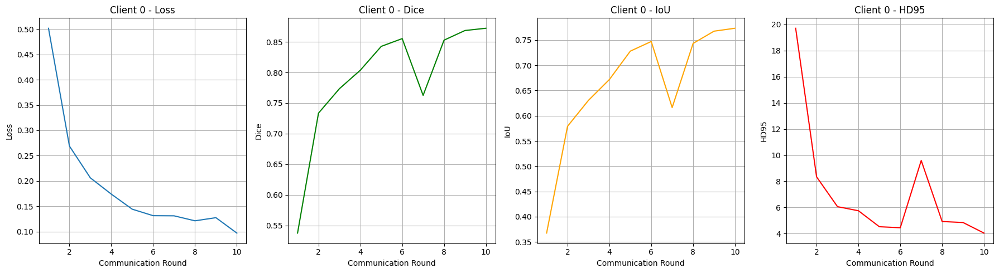

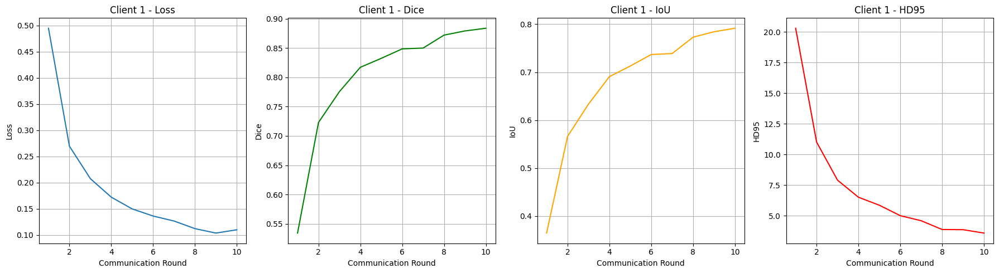

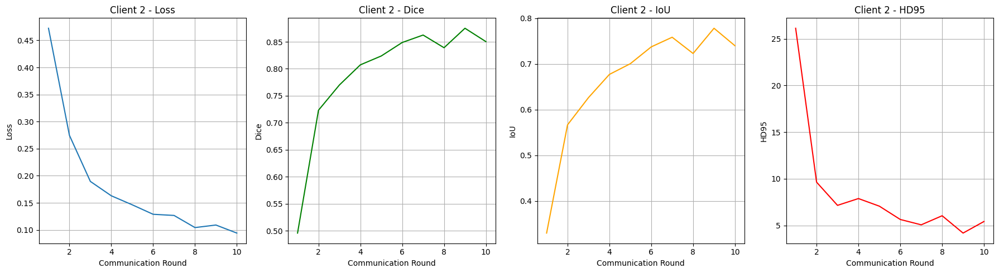

In [21]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

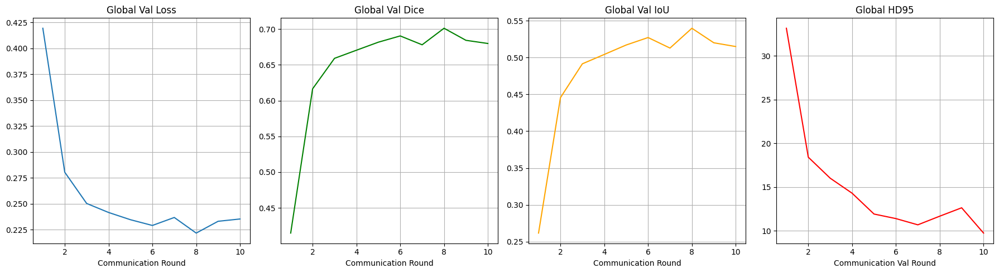

In [22]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [23]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []

from tqdm import tqdm

# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

C:\Users\LAB\AppData\Local\Temp\ipykernel_11048\1367524147.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_model.pth")


Test samples: 50
Factorizer(
  (stem): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  (encoder): UNetEncoder(
    (blocks): ModuleList(
      (0): UNetEncoderBlock(
        (downsample): Identity()
        (block): FactorizerStage(
          (pos_embed): Identity()
          (blocks): ModuleList(
            (0): FactorizerBlock(
              (norm1): LayerNorm(
                (norm): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
              )
              (fact): FactMixer(
                (in_proj): Linear(
                  (flatten): Flatten(start_dim=2, end_dim=-1)
                  (linear): Conv1d(32, 32, kernel_size=(1,), stride=(1,), bias=False)
                )
                (reshape): SWMatricize(
                  (shifted_windows): ModuleList(
                    (0-1): 2 x Matricize(
                      (rearrange): Rearrange('b (h d) (g0 p0) (g1 p1) (g2 p2) -> (b h) (g0 g1 g2) d (p0 p1 p2)', d=8, p0=2, p1=2, p2=2)

Testing:  46%|████▌     | 23/50 [00:05<00:06,  4.02it/s, Dice=0.6644, IoU=0.4975, HD95=13.0213]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:332: UserWarning: the prediction of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing:  54%|█████▍    | 27/50 [00:06<00:05,  4.11it/s, Dice=0.5939, IoU=0.4224, HD95=14.7816]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:327: UserWarning: the ground truth of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing: 100%|██████████| 50/50 [00:11<00:00,  4.23it/s, Dice=0.6580, IoU=0.4903, HD95=12.8081]


Test Set Metrics:
Dice: 0.6580
IoU: 0.4903
HD95: 12.8081


**Visualize**

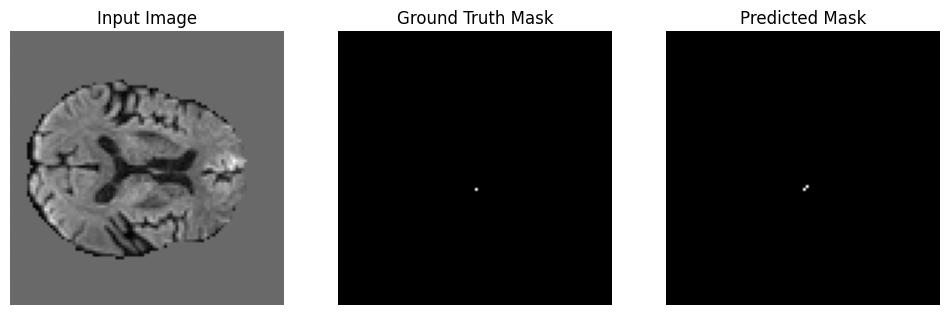

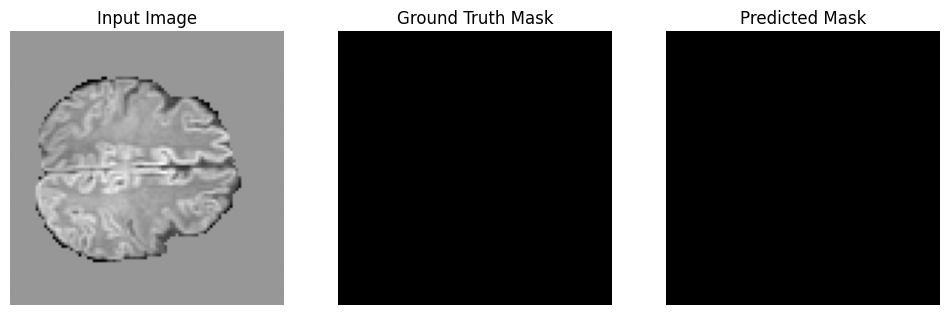

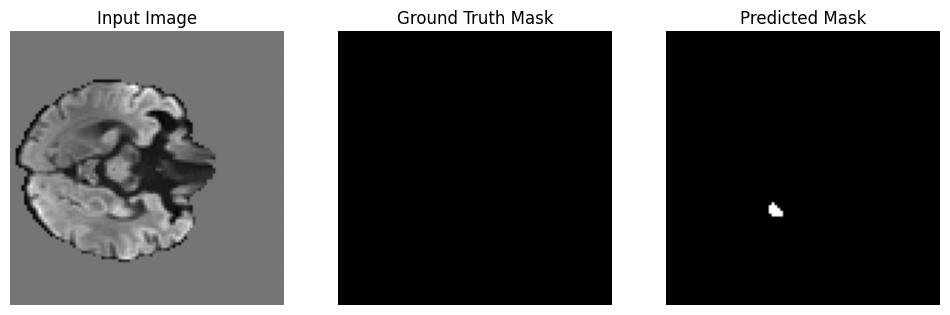

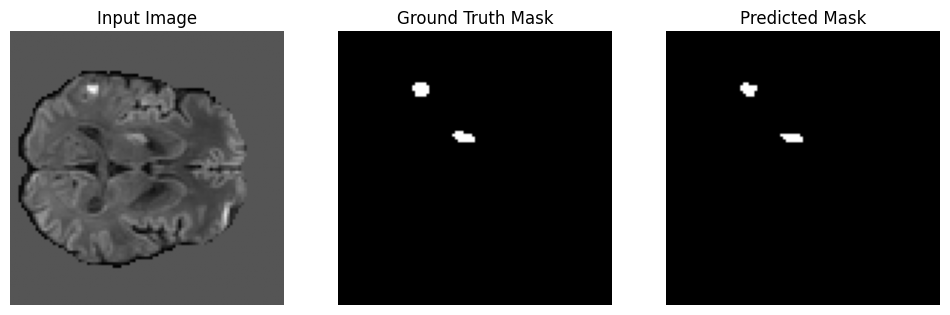

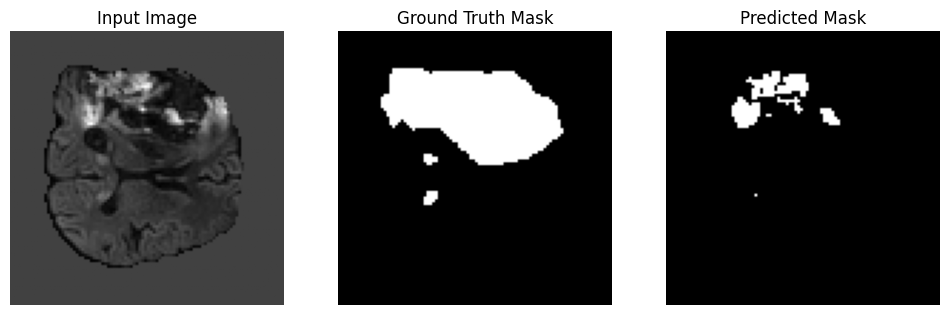

...

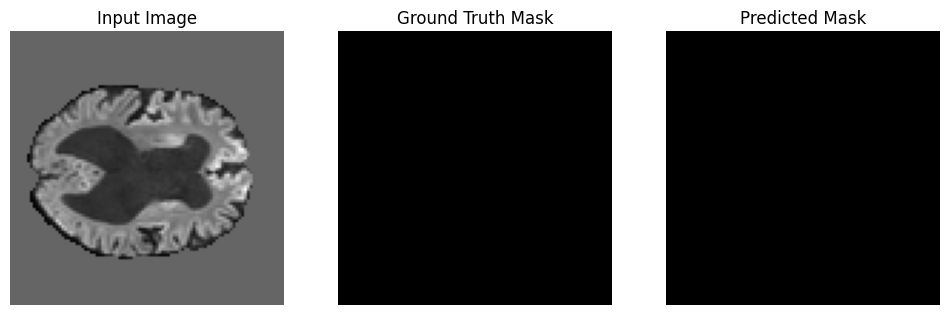

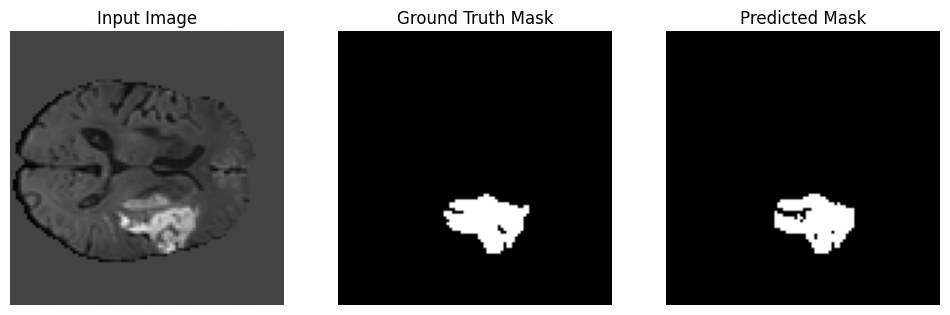

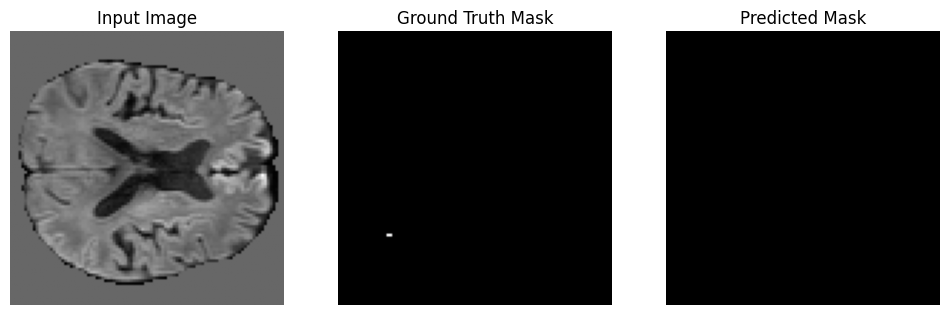

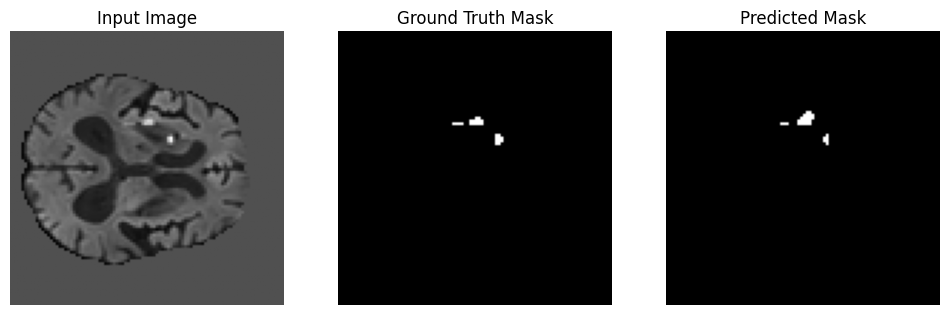

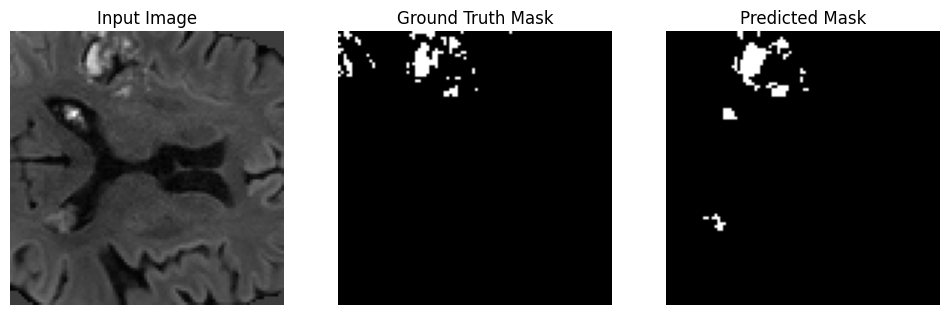

In [24]:
num_visualize = len(test_dataset)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()